># <font color = blue> <U>Lending Club Case Study - Submission by Mythili and Satya</U> </font>

## Problem Statement 

### Introduction
Solving this assignment will give you an idea about how real business problems are solved using EDA. In this case study, apart from applying the techniques you have learnt in EDA, you will also develop a basic understanding of risk analytics in banking and financial services and understand how data is used to minimise the risk of losing money while lending to customers.
  
### Business Understanding
You work for a consumer finance company which specialises in lending various types of loans to urban customers. When the company receives a loan application, the company has to make a decision for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:
- If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company
- If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company
 
The data given below contains information about past loan applicants and whether they ‘defaulted’ or not. The aim is to identify patterns which indicate if a person is likely to default, which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc.
 
In this case study, you will use EDA to understand how consumer attributes and loan attributes influence the tendency of default.

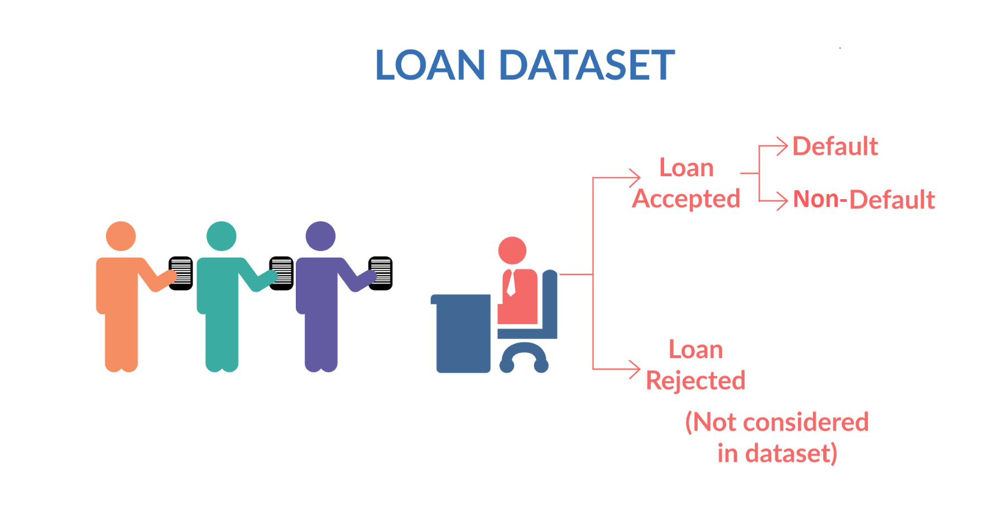
 
When a person applies for a loan, there are two types of decisions that could be taken by the company:
1. <B>Loan accepted:</B> If the company approves the loan, there are 3 possible scenarios described below:
>- <B>Fully paid:</B> Applicant has fully paid the loan (the principal and the interest rate)
>- <B>Current:</B> Applicant is in the process of paying the instalments, i.e. the tenure of the loan is not yet completed. These candidates are not labelled as 'defaulted'.
>- <B>Charged-off:</B> Applicant has not paid the instalments in due time for a long period of time, i.e. he/she has defaulted on the loan 
2. <B>Loan rejected:</B> The company had rejected the loan (because the candidate does not meet their requirements etc.). Since the loan was rejected, there is no transactional history of those applicants with the company and so this data is not available with the company (and thus in this dataset)
 
### Business Objectives
This company is the largest online loan marketplace, facilitating personal loans, business loans, and financing of medical procedures. Borrowers can easily access lower interest rate loans through a fast online interface. 
 
Like most other lending companies, lending loans to ‘risky’ applicants is the largest source of financial loss (called credit loss). Credit loss is the amount of money lost by the lender when the borrower refuses to pay or runs away with the money owed. In other words, borrowers who default cause the largest amount of loss to the lenders. In this case, the customers labelled as 'charged-off' are the 'defaulters'. 
 
If one is able to identify these risky loan applicants, then such loans can be reduced thereby cutting down the amount of credit loss. Identification of such applicants using EDA is the aim of this case study.
 
In other words, the company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment. 

To develop your understanding of the domain, you are advised to independently research a little about risk analytics (understanding the types of variables and their significance should be enough).
 
### Data Understanding
 
Download the dataset from the upgrad course module. It contains the complete loan data for all loans issued through the time period 2007 t0 2011.

You can access the data dictionary which describes the meaning of these variables from the provided link in upgrad course module.
 
### Results Expected
1. Write all your code in one well-commented Python file; briefly mention the insights and observations from the analysis 
2. Present the overall approach of the analysis in a presentation: 
>- Mention the problem statement and the analysis approach briefly 
>- Explain the results of univariate, bivariate analysis etc. in business terms
>- Include visualisations and summarise the most important results in the presentation
 
You need to submit one Ipython notebook which clearly explains the thought process behind your analysis (either in comments of markdown text), code and relevant plots. 
 
<B>Important Note</B>: Please make sure to rename your Python notebook "Group_Facilitator_Name.ipynb". 
 
You need to submit a GitHub repository link that contains the files above . You need to write a README.md for the GitHub repository.  You can follow the video in the module to understand how to create the GitHub repository. Make sure your GitHub link is public. 



## Import Necessary Libraries

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

import warnings
warnings.filterwarnings('ignore') #Ignore warnings

## Read data from loan file in dataframe

In [2]:
df = pd.read_csv('loan.csv') 

In [3]:
df.shape #Display shape of the data frame

(39717, 111)

In [4]:
pd.set_option('display.max_columns', None) #set dataframe to show all columns
df.head(5) #display top 5 rows from the dataframe

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [5]:
df.info(verbose=True, show_counts=True) #Display dataframe information for all columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

### Observations
- Total numbers of rows are 39717.
- Total numbers of columns are 111.
- Data type of some columns i.e. term, int_rate are object. These should be converted to int, float by removing non numeric characters from the value.
- Many columns i.e. emp_length, emp_length, desc etc have missing values. These needs to be imputed or dropped based on case to case basis.
- Many columns i.e. mths_since_last_major_derog, annual_inc_joint, dti_joint etc. have only null values. These columns can be dropped.
- Distribution of columns based on datatypes are: float64(74), int64(13), object(24)

## Data Cleaning on both rows and columns

### Check and drop columns having only null values

In [6]:
df.isnull().all().sum() # Count the number of columns having only null values

54

In [7]:
df = df.dropna(axis=1, how='all') # Drop all the columns having only null values

In [8]:
df.shape #Display shape of the dataframe after dropping null columns, it should be 57(111-54)

(39717, 57)

### Check missing values in remaining columns

In [9]:
(df.isnull().mean()*100).round(2)   #Display percentage of missing values for each column unpto two decimal points

id                             0.00
member_id                      0.00
loan_amnt                      0.00
funded_amnt                    0.00
funded_amnt_inv                0.00
term                           0.00
int_rate                       0.00
installment                    0.00
grade                          0.00
sub_grade                      0.00
emp_title                      6.19
emp_length                     2.71
home_ownership                 0.00
annual_inc                     0.00
verification_status            0.00
issue_d                        0.00
loan_status                    0.00
pymnt_plan                     0.00
url                            0.00
desc                          32.59
purpose                        0.00
title                          0.03
zip_code                       0.00
addr_state                     0.00
dti                            0.00
delinq_2yrs                    0.00
earliest_cr_line               0.00
inq_last_6mths              

In [10]:
null_perc = (df.isnull().mean()*100).round(2) #Store null %age of all columns
null_perc[null_perc >0].sort_values(ascending=False) #Display only the columns with null values in descending order

next_pymnt_d                  97.13
mths_since_last_record        92.99
mths_since_last_delinq        64.66
desc                          32.59
emp_title                      6.19
emp_length                     2.71
pub_rec_bankruptcies           1.75
last_pymnt_d                   0.18
collections_12_mths_ex_med     0.14
chargeoff_within_12_mths       0.14
revol_util                     0.13
tax_liens                      0.10
title                          0.03
last_credit_pull_d             0.01
dtype: float64

### Drop/Impute columns having too many missing values - more than 40 to 50%
#### As a rule of thumb we should not consider any columns with more than 40 to 50% missing values. But lets look at case to case basis for columns matching this criteria.
1. next_pymnt_d(97% missing values) - Next scheduled payment date:- 
- Since this column as 97% missing records and we does not need it for our analysis, we can drop it
2. mths_since_last_record(93% missing values) - The number of months since the last public record:-
- As per the definition of this field, it is expected that not all rows will have data. This column can be meaningful during out analysis so lets keep it and replace all null values with zero.
3. mths_since_last_delinq(65% missing values) - The number of months since the borrower's last delinquency:-
- As per the definition of this field, it is expected that not all rows will have data. This column can be meaningful during out analysis so lets keep it and replace all null values with zero.

In [11]:
df=df.drop("next_pymnt_d",axis=1)

In [12]:
df["mths_since_last_record"]=df["mths_since_last_record"].fillna(0) #impute mths_since_last_record with zero for missing  values
df["mths_since_last_delinq"]=df["mths_since_last_delinq"].fillna(0) #impute mths_since_last_delinq with zero for missing  values

In [13]:
null_perc = (df.isnull().mean()*100).round(2) #Store null %age of all columns
null_perc[null_perc >0].sort_values(ascending=False) #Display only the columns with null values in descending order

desc                          32.59
emp_title                      6.19
emp_length                     2.71
pub_rec_bankruptcies           1.75
last_pymnt_d                   0.18
collections_12_mths_ex_med     0.14
chargeoff_within_12_mths       0.14
revol_util                     0.13
tax_liens                      0.10
title                          0.03
last_credit_pull_d             0.01
dtype: float64

### Drop/Impute other columns with missing values

In [14]:
df.head(5)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,0.0,0.0,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,0.0,0.0,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,0.0,0.0,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,0.0,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0,Jan-96,0,38.0,0.0,15,0,27783,53.90%,38,f,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


#### desc - Loan description provided by the borrower

In [15]:
#Desc does not seem relevant for our analysis and has 33% missing value. So lets drop it
df=df.drop("desc",axis=1)

#### emp_title - The job title supplied by the Borrower when applying for the loan.(Employer Title replaces Employer Name for all loans listed after 9/23/2013)

In [16]:
#emp_title does not seem relevant for our analysis and has 6% missing value. So lets drop it
df=df.drop("emp_title",axis=1)

#### emp_length - Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

In [17]:
#emp_length seems relevant for our analysis. So, lets look at the rows with missing values
df[df["emp_length"].isnull()]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
168,1067644,1302032,2500,2500,2500.00000,36 months,7.51%,77.78,A,A3,NaN,OWN,12000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,GET FREE OF DEBT,961xx,CA,16.30,0,Aug-94,2,0.0,0.0,13,0,4853,42.20%,20,f,0.0,0.0,1838.880000,1838.88,1575.06,253.74,0.00,10.08,0.0000,Dec-13,77.78,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
323,1058717,1290516,18000,18000,18000.00000,60 months,17.58%,452.98,D,D4,NaN,MORTGAGE,60000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,consolidation,363xx,AL,21.96,0,Mar-03,1,75.0,0.0,11,0,5945,83.70%,28,f,0.0,0.0,26378.550010,26378.55,18000.00,8378.55,0.00,0.00,0.0000,Sep-15,6909.59,Sep-15,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
394,1064582,1298394,4000,4000,4000.00000,36 months,11.71%,132.31,B,B3,NaN,RENT,24000.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Reline pool and fix steeps,328xx,FL,7.50,1,Feb-05,0,16.0,0.0,4,0,1593,54.90%,6,f,0.0,0.0,4186.023030,4186.02,4000.00,186.02,0.00,0.00,0.0000,May-12,3658.15,May-12,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
422,1064366,1298164,1000,1000,1000.00000,36 months,14.65%,34.50,C,C3,NaN,RENT,18408.0,Not Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,major_purchase,Myloan,080xx,NJ,6.00,0,Apr-93,2,0.0,114.0,3,1,2510,83.70%,8,f,0.0,0.0,91.310000,91.31,22.24,12.18,0.00,56.89,10.2402,Jan-12,34.50,Jun-12,0.0,1,INDIVIDUAL,0,0.0,0,1.0,0.0
439,1063912,1296491,8250,8250,8250.00000,36 months,7.51%,256.67,A,A3,NaN,MORTGAGE,31500.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,do over,218xx,MD,17.87,0,Dec-81,4,0.0,0.0,17,0,7521,10.40%,37,f,0.0,0.0,9239.889998,9239.89,8250.00,989.89,0.00,0.00,0.0000,Dec-14,278.92,Dec-14,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32591,480410,610728,10000,10000,9975.00000,36 months,14.22%,342.85,C,C5,NaN,RENT,45000.0,Not Verified,Jan-10,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,small_business,Expanding Salon Business,191xx,PA,4.51,0,Sep-00,0,37.0,0.0,9,0,9696,66.40%,17,f,0.0,0.0,10457.944160,10431.80,10000.00,457.94,0.00,0.00,0.0000,Jun-10,9431.97,Jul-10,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
32608,480216,610335,3700,3700,3700.00000,36 months,14.22%,126.86,C,C5,NaN,RENT,17496.8,Not Verified,Jan-10,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,other,Financial Freedom,752xx,TX,3.36,0,Aug-06,0,0.0,0.0,2,0,1605,45.90%,5,f,0.0,0.0,4566.723907,4566.72,3700.00,866.72,0.00,0.00,0.0000,Feb-13,132.70,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
32621,479954,609955,10000,10000,9731.17513,36 months,14.22%,342.85,C,C5,NaN,MORTGAGE,36000.0,Not Verified,Jan-10,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,other,Retired & Happy,021xx,MA,3.83,2,Apr-00,3,19.0,0.0,3,0,344,34.40%,19,f,0.0,0.0,7542.370000,7431.53,5591.87,1938.07,0.00,12.43,4.3000,Dec-11,342.85,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
32631,479836,609803,6000,6000,6000.00000,36 months,12.73%,201.40,C,C1,NaN,MORTGAGE,60000.0,Not

Number of rows with missing values is 1075 out of 39717, which is 2.7%. Looking the data it does not appear that we can somehow derive this data from other columns so lets drop the rows with missing values

In [18]:
df = df[df["emp_length"].notna()] #overwrite dataframe with valid rows 

In [19]:
df.shape #number of remaing rows should be 38642(39717-1075)

(38642, 54)

#### pub_rec_bankruptcies - Number of public record bankruptcies

In [20]:
#pub_rec_bankruptcies seems relevant for our analysis. So, lets look at the rows with missing values
df[df["pub_rec_bankruptcies"].isnull()]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
35006,69001,265533,15000,15000,14875.000000,36 months,8.94%,476.58,A,A5,< 1 year,MORTGAGE,110000.0,Not Verified,Sep-09,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Revolving Debt,146xx,NY,7.07,0,Nov-91,1,0.0,0.0,6,0,7586,52.70%,19,f,0.0,0.0,17135.510230,16992.71,15000.00,2135.51,0.0,0.0,0.0,Jul-12,1919.13,Aug-15,0.0,1,INDIVIDUAL,0,0.0,0,NaN,0.0
35058,59006,154254,3000,3000,2988.236621,36 months,14.26%,102.92,C,C5,3 years,MORTGAGE,80800.0,Not Verified,Sep-09,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Rejecting new cardmember agreement,775xx,TX,14.97,1,Jul-98,0,13.0,0.0,13,0,4740,39.50%,23,f,0.0,0.0,3704.997650,3688.85,3000.00,705.00,0.0,0.0,0.0,Oct-12,111.23,Sep-12,0.0,1,INDIVIDUAL,0,0.0,0,NaN,0.0
35362,65426,232106,4000,4000,3892.258856,36 months,11.14%,131.22,B,B1,< 1 year,MORTGAGE,60000.0,Not Verified,Aug-09,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,car,djp,481xx,MI,11.08,0,Aug-95,0,0.0,0.0,14,0,24220,68.60%,33,f,0.0,0.0,2755.200000,2615.80,2170.35,584.85,0.0,0.0,0.0,Jun-11,131.22,May-16,0.0,1,INDIVIDUAL,0,0.0,0,NaN,0.0
38443,68926,264924,2300,2300,589.605658,36 months,13.17%,77.69,D,D2,10+ years,RENT,37152.0,Verified,Aug-08,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,moving,tee_cee,088xx,NJ,2.26,0,Dec-97,0,46.0,0.0,4,0,2211,88.40%,13,f,0.0,0.0,2796.601136,643.50,2300.00,496.60,0.0,0.0,0.0,Sep-11,77.78,May-16,0.0,1,INDIVIDUAL,0,0.0,0,NaN,0.0
38717,69251,267771,6000,6000,500.000000,36 months,8.00%,188.02,A,A3,< 1 year,MORTGAGE,75000.0,Not Verified,May-08,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,other,NewOrganic,441xx,OH,16.08,0,Dec-94,1,0.0,0.0,16,0,29797,23.20%,39,f,0.0,0.0,6783.750468,565.31,5999.99,768.76,15.0,0.0,0.0,May-11,189.36,May-11,0.0,1,INDIVIDUAL,0,0.0,0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92187,92174,2500,2500,1075.000000,36 months,8.07%,78.42,A,A4,4 years,MORTGAGE,110000.0,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home Improvement,802xx,CO,11.33,0,Nov-90,0,0.0,0.0,13,0,7274,13.10%,40,f,0.0,0.0,2822.969293,1213.88,2500.00,322.97,0.0,0.0,0.0,Jul-10,80.90,Jun-10,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39713,90665,90607,8500,8500,875.000000,36 months,10.28%,275.38,C,C1,3 years,RENT,18000.0,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Retiring credit card debt,274xx,NC,6.40,1,Dec-86,1,5.0,0.0,6,0,8847,26.90%,9,f,0.0,0.0,9913.491822,1020.51,8500.00,1413.49,0.0,0.0,0.0,Jul-10,281.94,Jul-10,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39714,90395,90390,5000,5000,1325.000000,36 months,8.07%,156.84,A,A4,< 1 year,MORTGAGE,100000.0,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,MBA Loan Consolidation,017xx,MA,2.30,0,Oct-98,0,0.0,0.0,11,0,9698,19.40%,20,f,0.0,0.0,5272.161128,1397.12,5000.00,272.16,0.0,0.0,0.0,Apr-08,0.00,Jun-07,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39715,90376,89243,5000,5000,650.000000,36 months,7.43%,155.38,A,A2,< 1 year,MORTGAGE,200000.0,Not Verified,Jul-07,Ful

In [21]:
null_perc = (df.isnull().mean()*100).round(2) #Store null %age of all columns
null_perc[null_perc >0].sort_values(ascending=False) #Display only the columns with null values in descending order

pub_rec_bankruptcies          1.80
last_pymnt_d                  0.17
collections_12_mths_ex_med    0.14
chargeoff_within_12_mths      0.14
revol_util                    0.12
tax_liens                     0.10
title                         0.03
last_credit_pull_d            0.01
dtype: float64

In [22]:
df["pub_rec_bankruptcies"].value_counts()

pub_rec_bankruptcies
0.0    36375
1.0     1563
2.0        7
Name: count, dtype: int64

We can see that almost 95% of the rows have value as zero, so we can safely fill the null values with zero

In [23]:
df['pub_rec_bankruptcies'].mode()[0]

0.0

In [24]:
df["pub_rec_bankruptcies"]=df["pub_rec_bankruptcies"].fillna(df['pub_rec_bankruptcies'].mode()[0]) #impute pub_rec_bankruptcies with mode value

In [25]:
df["pub_rec_bankruptcies"].value_counts()

pub_rec_bankruptcies
0.0    37072
1.0     1563
2.0        7
Name: count, dtype: int64

#### Remaining columns with missing values are very less. We can safely drop the rows with null values
- <B>Column name -                   Percentage of null values</B>
- last_pymnt_d                  0.17
- collections_12_mths_ex_med    0.14
- chargeoff_within_12_mths      0.14
- revol_util                    0.12
- tax_liens                     0.10
- title                         0.03
- last_credit_pull_d            0.01

In [26]:
df.shape

(38642, 54)

In [27]:
df1 = df #backup data frame

In [28]:
df.isnull().any(axis=1).sum() #number of rows having any null values

177

In [29]:
df.dropna(inplace=True) #drop all the rows having null values

In [30]:
df.shape

(38465, 54)

<B>We can see that 38642-38465=177 rows got dropped. Number of columns remains same as 54, before and after</B>

In [31]:
df.isnull().sum()   #Display count of missing values for each column, all should be zeroes

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_length                    0
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
url                           0
purpose                       0
title                         0
zip_code                      0
addr_state                    0
dti                           0
delinq_2yrs                   0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq        0
mths_since_last_record        0
open_acc                      0
pub_rec                       0
revol_bal                     0
revol_ut

In [32]:
#drop records with loan status as current since we are only interest in fully paid and charged off loans
df.loan_status.value_counts()

loan_status
Fully Paid     32053
Charged Off     5314
Current         1098
Name: count, dtype: int64

In [33]:
df = df[df.loan_status != 'Current'] #drop loan records for current loans
df.loan_status.value_counts()

loan_status
Fully Paid     32053
Charged Off     5314
Name: count, dtype: int64

### Check for columns having only one unique value and drop them 

In [34]:
df.nunique() #unique values in dataframe

id                            37367
member_id                     37367
loan_amnt                       865
funded_amnt                    1015
funded_amnt_inv                7932
term                              2
int_rate                        370
installment                   14733
grade                             7
sub_grade                        35
emp_length                       11
home_ownership                    5
annual_inc                     4992
verification_status               3
issue_d                          53
loan_status                       2
pymnt_plan                        1
url                           37367
purpose                          14
title                         18747
zip_code                        819
addr_state                       50
dti                            2848
delinq_2yrs                      11
earliest_cr_line                514
inq_last_6mths                    9
mths_since_last_delinq           95
mths_since_last_record      

In [35]:
columns_to_drop = df.columns[df.nunique() == 1] #column names with only 1 unique value in dataframe - 9 columns

In [36]:
df.shape

(37367, 54)

In [37]:
df = df.drop(columns=columns_to_drop,axis=1)

In [38]:
df.shape

(37367, 43)

In [39]:
#Reset the index
df.reset_index(inplace=True, drop=True)

## Fix data types of object type columns

In [40]:
df.select_dtypes(include=object).info() #display information of only the columns having datatype as object

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37367 entries, 0 to 37366
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   term                 37367 non-null  object
 1   int_rate             37367 non-null  object
 2   grade                37367 non-null  object
 3   sub_grade            37367 non-null  object
 4   emp_length           37367 non-null  object
 5   home_ownership       37367 non-null  object
 6   verification_status  37367 non-null  object
 7   issue_d              37367 non-null  object
 8   loan_status          37367 non-null  object
 9   url                  37367 non-null  object
 10  purpose              37367 non-null  object
 11  title                37367 non-null  object
 12  zip_code             37367 non-null  object
 13  addr_state           37367 non-null  object
 14  earliest_cr_line     37367 non-null  object
 15  revol_util           37367 non-null  object
 16  last

In [41]:
df.select_dtypes(include=object).head(5) #Display values of only the object data type columns

,term,int_rate,grade,sub_grade,emp_length,home_ownership,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,earliest_cr_line,revol_util,last_pymnt_d,last_credit_pull_d
0,36 months,10.65%,B,B2,10+ years,RENT,Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Computer,860xx,AZ,Jan-85,83.70%,Jan-15,May-16
1,60 months,15.27%,C,C4,< 1 year,RENT,Source Verified,Dec-11,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,car,bike,309xx,GA,Apr-99,9.40%,Apr-13,Sep-13
2,36 months,15.96%,C,C5,10+ years,RENT,Not Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,small_business,real estate business,606xx,IL,Nov-01,98.50%,Jun-14,May-16
3,36 months,13.49%,C,C1,10+ years,RENT,Source Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,other,personel,917xx,CA,Feb-96,21%,Jan-15,Apr-16
4,36 months,7.90%,A,A4,3 years,RENT,Source Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,wedding,My wedding loan I promise to pay back,852xx,AZ,Nov-04,28.30%,Jan-15,Jan-16


#### Observations
- Some columns i.e. url, zip_code are not relevant for this analsys and can be dropped.
- Some columns i.e. term, int_rate, revol_util can be changed to numeric data types.
- Some columns i.e. issue_d, earliest_cr_line, last_pymnt_d, last_credit_pull_d contains date value which can be changed to date datatype.

In [42]:
df1 = df #backup dataframe as a point of restore

In [43]:
df = df.drop(columns=["url","zip_code"]) #drop columns that are not needed

In [44]:
df.term.value_counts() 

term
 36 months    28131
 60 months     9236
Name: count, dtype: int64

In [45]:
df.term = df.term.apply(lambda x: int(x[:3])) #extract numbers from term column and change to int data type

In [46]:
df.term.dtype

dtype('int64')

In [47]:
df.int_rate = df.int_rate.str.replace('%', '').astype(float) #remove % symbol from int_rate column and change data type to float

In [48]:
df.int_rate.dtype

dtype('float64')

In [49]:
df.revol_util = df.revol_util.str.replace('%', '').astype(float) #remove % symbol from revol_util column and change data type to float

In [50]:
df.revol_util.dtype

dtype('float64')

In [51]:
# Convert the Date columns:issue_d, earliest_cr_line, last_pymnt_d, last_credit_pull_d to datetime format
df['issue_d'] = pd.to_datetime(df['issue_d'], format='%b-%y')
df['earliest_cr_line'] = pd.to_datetime(df['earliest_cr_line'], format='%b-%y')
df['last_pymnt_d'] = pd.to_datetime(df['last_pymnt_d'], format='%b-%y')
df['last_credit_pull_d'] = pd.to_datetime(df['last_credit_pull_d'], format='%b-%y')

In [52]:
df.issue_d.dtype

dtype('<M8[ns]')

In [53]:
df.head(5)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36,10.65,162.87,B,B2,10+ years,RENT,24000.0,Verified,2011-12-01,Fully Paid,credit_card,Computer,AZ,27.65,0,1985-01-01,1,0.0,0.0,3,0,13648,83.7,9,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,2015-01-01,171.62,2016-05-01,0.0
1,1077430,1314167,2500,2500,2500.0,60,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,2011-12-01,Charged Off,car,bike,GA,1.00,0,1999-04-01,5,0.0,0.0,3,0,1687,9.4,4,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,2013-04-01,119.66,2013-09-01,0.0
2,1077175,1313524,2400,2400,2400.0,36,15.96,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,2011-12-01,Fully Paid,small_business,real estate business,IL,8.72,0,2001-11-01,2,0.0,0.0,2,0,2956,98.5,10,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,2014-06-01,649.91,2016-05-01,0.0
3,1076863,1277178,10000,10000,10000.0,36,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,2011-12-01,Fully Paid,other,personel,CA,20.00,0,1996-02-01,1,35.0,0.0,10,0,5598,21.0,37,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,2015-01-01,357.48,2016-04-01,0.0
4,1075269,1311441,5000,5000,5000.0,36,7.90,156.46,A,A4,3 years,RENT,36000.0,Source Verified,2011-12-01,Fully Paid,wedding,My wedding loan I promise to pay back,AZ,11.20,0,2004-11-01,3,0.0,0.0,9,0,7963,28.3,12,5632.210000,5632.21,5000.00,632.21,0.00,0.00,0.00,2015-01-01,161.03,2016-01-01,0.0


In [54]:
df.select_dtypes(include=object).info() #display information of only the columns having datatype as object

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37367 entries, 0 to 37366
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   grade                37367 non-null  object
 1   sub_grade            37367 non-null  object
 2   emp_length           37367 non-null  object
 3   home_ownership       37367 non-null  object
 4   verification_status  37367 non-null  object
 5   loan_status          37367 non-null  object
 6   purpose              37367 non-null  object
 7   title                37367 non-null  object
 8   addr_state           37367 non-null  object
dtypes: object(9)
memory usage: 2.6+ MB


In [55]:
df.select_dtypes(include=object).head(5) #Display values of only the object data type columns

,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state
0,B,B2,10+ years,RENT,Verified,Fully Paid,credit_card,Computer,AZ
1,C,C4,< 1 year,RENT,Source Verified,Charged Off,car,bike,GA
2,C,C5,10+ years,RENT,Not Verified,Fully Paid,small_business,real estate business,IL
3,C,C1,10+ years,RENT,Source Verified,Fully Paid,other,personel,CA
4,A,A4,3 years,RENT,Source Verified,Fully Paid,wedding,My wedding loan I promise to pay back,AZ


In [56]:
df.select_dtypes(include=object).nunique() #check count of unique values of object datatypes

grade                      7
sub_grade                 35
emp_length                11
home_ownership             5
verification_status        3
loan_status                2
purpose                   14
title                  18747
addr_state                50
dtype: int64

<B> Title is having too many unique values to make any sense out of it, so it can be dropped </B>

In [57]:
df.drop('title',axis=1,inplace=True)

In [58]:
#Change emp_lenght to numeric by removing text characters i.e. <,+,years,year
df.emp_length.value_counts()

emp_length
10+ years    8474
< 1 year     4469
2 years      4273
3 years      3997
4 years      3322
5 years      3176
1 year       3143
6 years      2161
7 years      1704
8 years      1428
9 years      1220
Name: count, dtype: int64

In [59]:
# Extract the numbers and convert the data type to int
df['emp_length'] = df['emp_length'].str.extract('(\d+)')
df['emp_length'] = pd.to_numeric(df['emp_length'])
df.emp_length.value_counts()


emp_length
10    8474
1     7612
2     4273
3     3997
4     3322
5     3176
6     2161
7     1704
8     1428
9     1220
Name: count, dtype: int64

In [60]:
df['emp_length'].dtype

dtype('int64')

## Add derived columns

In [61]:
#creating new column 'month' and 'year' from 'issue_d' column
df["issue_d_year"] = df.issue_d.dt.year
df['issue_d_month'] = df.issue_d.dt.strftime('%b')

## Drop outliers

In [62]:
df1=df
df.shape

(37367, 42)

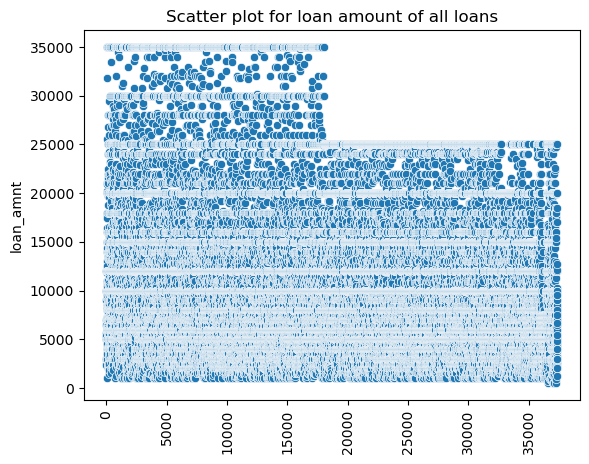

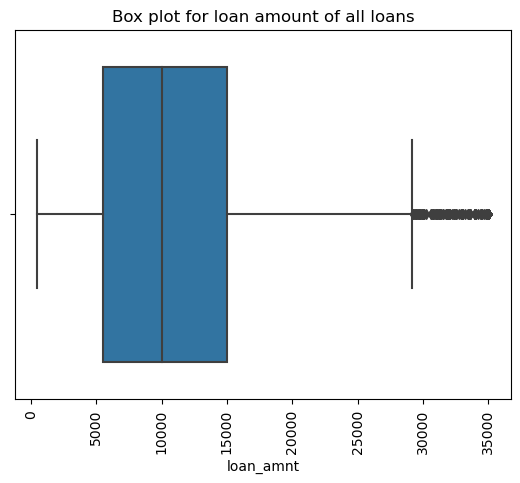

In [63]:
#Plot scatter plot and box plot for loan amount
plt.title("Scatter plot for loan amount of all loans", fontsize=12)
sns.scatterplot(df["loan_amnt"])
plt.xticks(rotation=90)
plt.show()

plt.title("Box plot for loan amount of all loans", fontsize=12)
sns.boxplot(x=df["loan_amnt"])
plt.xticks(rotation=90)
plt.show()


In [64]:
#From the above plots we can see that 100 percentile falls around 30000 and there are outliers beyond that
len(df[df["loan_amnt"] > 30000])

719

In [65]:
#drop rows with loan amount >30000

df = df[df["loan_amnt"] <= 30000]

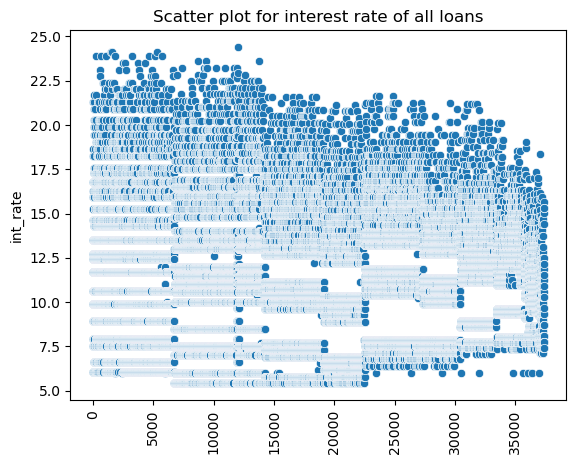

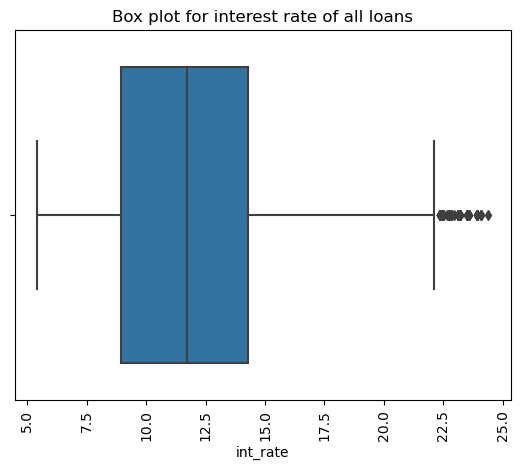

In [66]:
#Plot scatter plot and box plot for interest rate
plt.title("Scatter plot for interest rate of all loans", fontsize=12)
sns.scatterplot(df["int_rate"])
plt.xticks(rotation=90)
plt.show()

plt.title("Box plot for interest rate of all loans", fontsize=12)
sns.boxplot(x=df["int_rate"])
plt.xticks(rotation=90)
plt.show()

In [67]:
#From the above plots we can see that 100 percentile falls around 22.5 and there are outliers beyond that
len(df[df["int_rate"] > 22.5])

48

In [68]:
#drop rows with interest rate > 22.5

df = df[df["int_rate"] <= 22.5]

In [69]:
df.shape

(36600, 42)

In [70]:
df.home_ownership.value_counts()

home_ownership
RENT        17775
MORTGAGE    16016
OWN          2712
OTHER          96
NONE            1
Name: count, dtype: int64

In [71]:
#drop row with home ownership as none
df = df[df["home_ownership"] != "NONE"]

In [72]:
df.shape

(36599, 42)

## Categorize the variables for analysis

In [73]:
df.nunique()

id                         36599
member_id                  36599
loan_amnt                    825
funded_amnt                  939
funded_amnt_inv             7654
term                           2
int_rate                     359
installment                14356
grade                          7
sub_grade                     35
emp_length                    10
home_ownership                 4
annual_inc                  4919
verification_status            3
issue_d                       53
loan_status                    2
purpose                       14
addr_state                    50
dti                         2844
delinq_2yrs                   11
earliest_cr_line             513
inq_last_6mths                 9
mths_since_last_delinq        95
mths_since_last_record       111
open_acc                      40
pub_rec                        5
revol_bal                  20547
revol_util                  1086
total_acc                     81
total_pymnt                34885
total_pymn

In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 36599 entries, 0 to 37366
Data columns (total 42 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   id                       36599 non-null  int64         
 1   member_id                36599 non-null  int64         
 2   loan_amnt                36599 non-null  int64         
 3   funded_amnt              36599 non-null  int64         
 4   funded_amnt_inv          36599 non-null  float64       
 5   term                     36599 non-null  int64         
 6   int_rate                 36599 non-null  float64       
 7   installment              36599 non-null  float64       
 8   grade                    36599 non-null  object        
 9   sub_grade                36599 non-null  object        
 10  emp_length               36599 non-null  int64         
 11  home_ownership           36599 non-null  object        
 12  annual_inc               36599 non-nu

In [75]:
cat_cols=["term","grade","sub_grade","home_ownership","verification_status","loan_status","purpose","addr_state","inq_last_6mths","pub_rec","pub_rec_bankruptcies","issue_d_year","issue_d_month",]
num_cols=["loan_amnt","int_rate","installment","annual_inc","issue_d","dti","emp_length"]
extra_cols=["id","member_id","funded_amnt","funded_amnt_inv","revol_bal","total_pymnt_inv","delinq_2yrs","earliest_cr_line","mths_since_last_delinq","mths_since_last_record","open_acc","revol_util","total_acc","total_pymnt","total_rec_prncp","total_rec_int","total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_d","last_pymnt_amnt","last_credit_pull_d"]

In [76]:
df[num_cols].info() #validate that all the numeric columns have the right data types

<class 'pandas.core.frame.DataFrame'>
Index: 36599 entries, 0 to 37366
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   loan_amnt    36599 non-null  int64         
 1   int_rate     36599 non-null  float64       
 2   installment  36599 non-null  float64       
 3   annual_inc   36599 non-null  float64       
 4   issue_d      36599 non-null  datetime64[ns]
 5   dti          36599 non-null  float64       
 6   emp_length   36599 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(2)
memory usage: 2.2 MB


In [77]:
df1=df #backup data frame as a point of restore

In [78]:
df=df.drop(extra_cols,axis=1) #drop extra columns

In [79]:
df.shape

(36599, 20)

In [80]:
#Reset the index
df.reset_index(inplace=True, drop=True)

## Univariate Analysis

### Numerical

In [81]:
df.loan_status.value_counts()

loan_status
Fully Paid     31481
Charged Off     5118
Name: count, dtype: int64

In [82]:
#we can drop records of current loans since that is not relevant for our analysis
df = df[df.loan_status != 'Current'] #drop loan records for current loans
df.loan_status.value_counts()


loan_status
Fully Paid     31481
Charged Off     5118
Name: count, dtype: int64

In [83]:
df_defaulted = df[df.loan_status == 'Charged Off'] #filter loan records for defualted loans
df_defaulted.shape

(5118, 20)

In [84]:
df_fullypaid = df[df.loan_status == 'Fully Paid'] #filter loan records for fully paid loans
df_fullypaid.shape

(31481, 20)

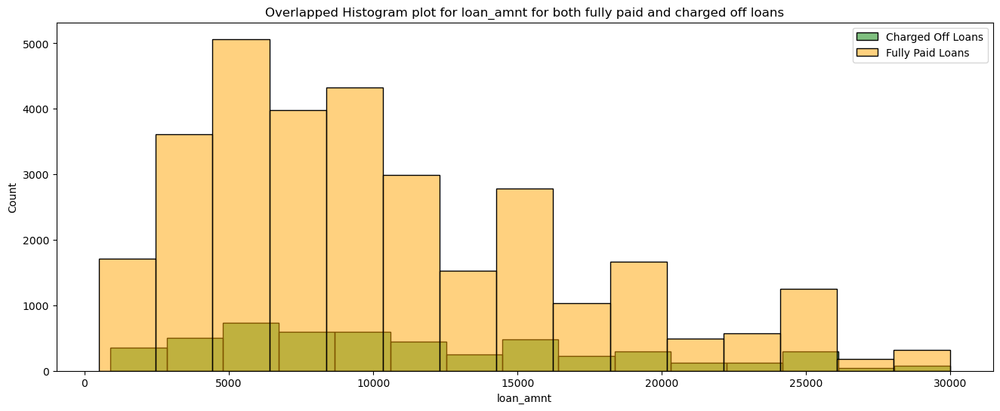

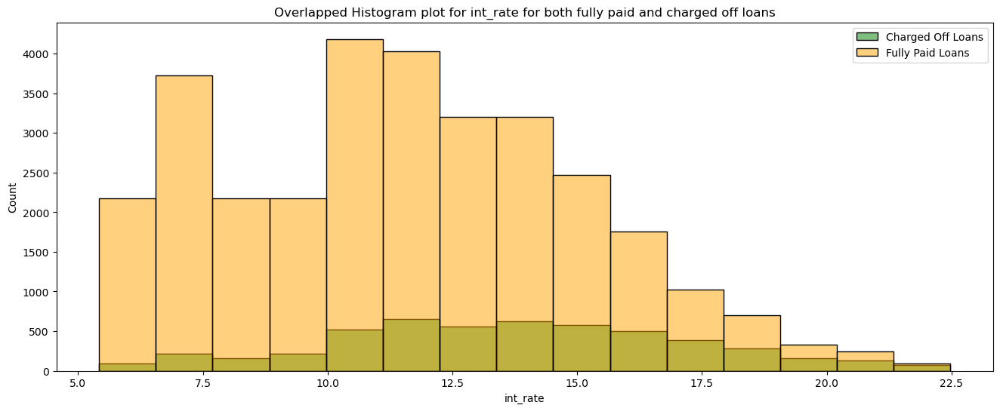

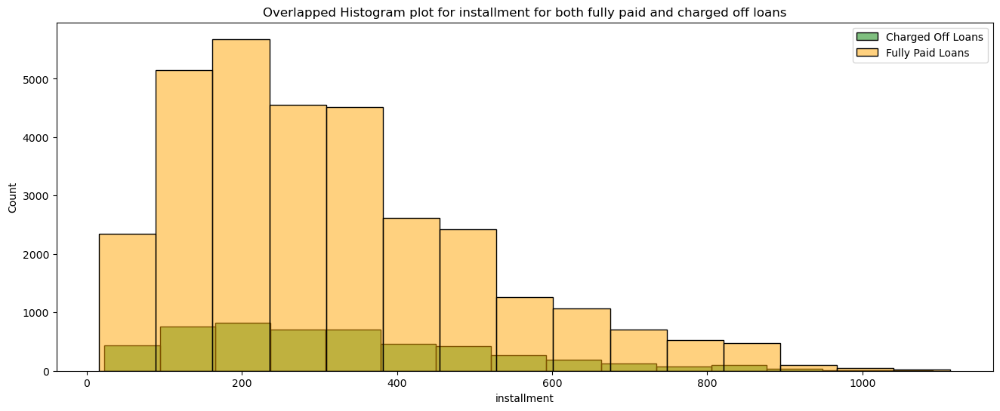

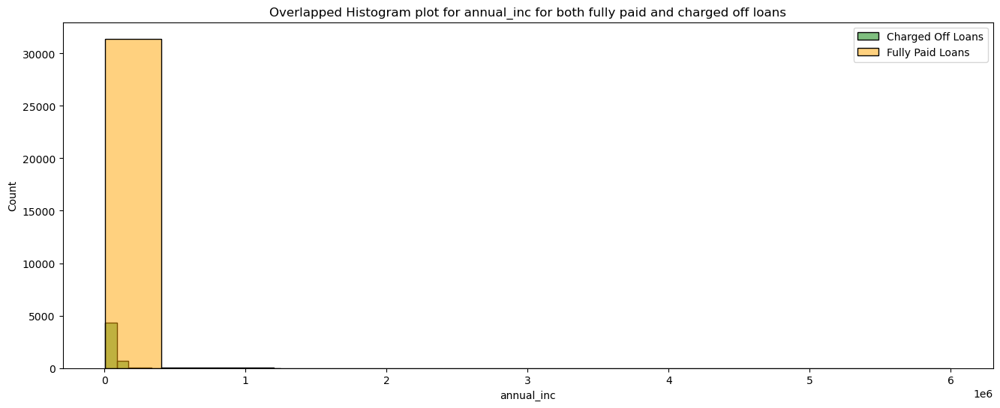

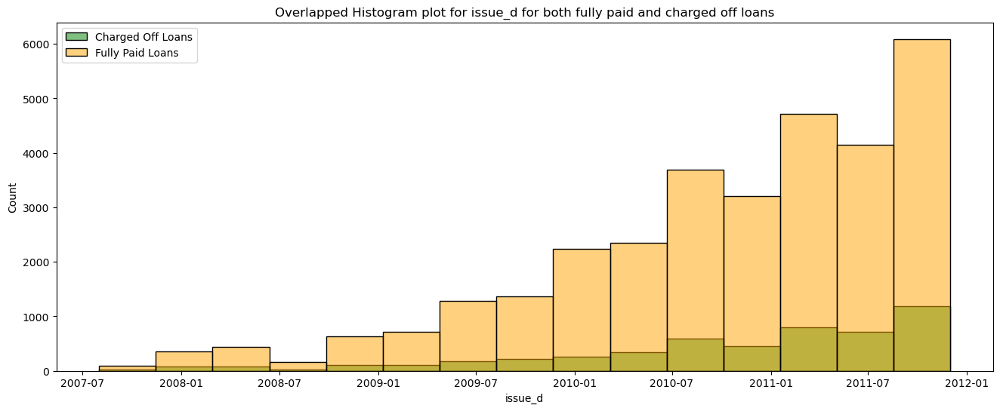

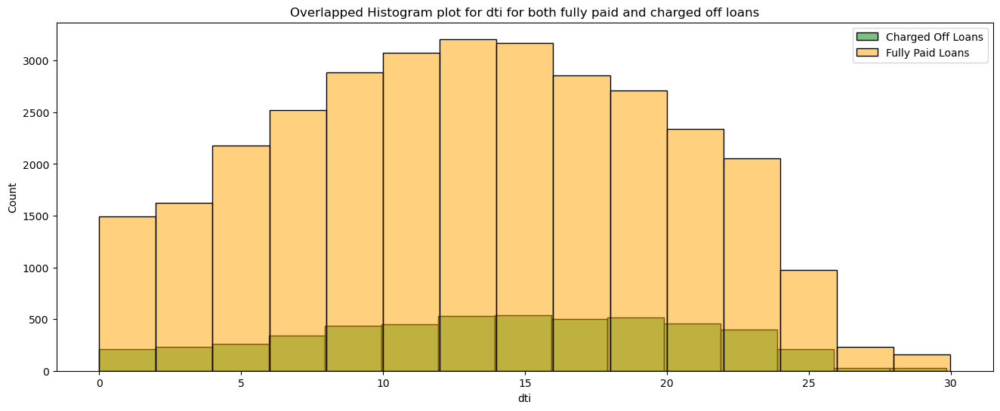

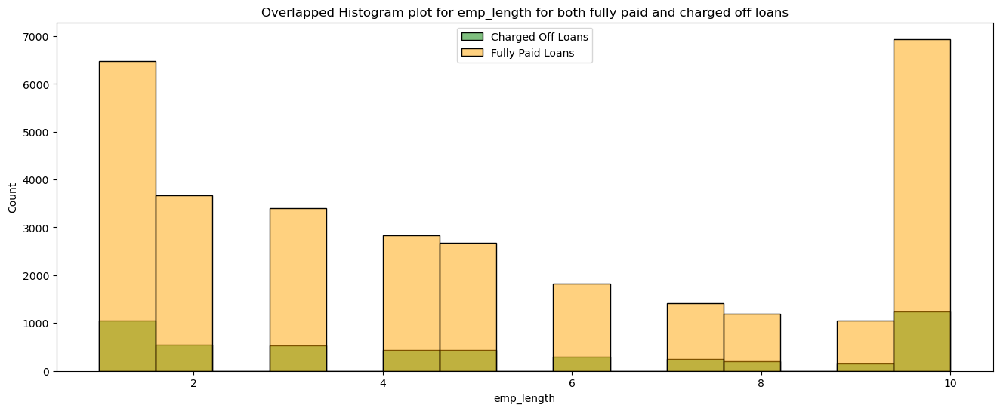

In [85]:
# Plot overlapped histogram plot for all numerical columns
for col in num_cols:
    plt.figure(figsize=(16, 6))
    # Use hue to distinguish between defaulted and fully paid loans
    sns.histplot(data=df_defaulted, x=col, color='green', bins=15, alpha=0.5, label='Charged Off Loans')
    sns.histplot(data=df_fullypaid, x=col, color='orange', bins= 15, alpha=0.5, label='Fully Paid Loans')
    plt.title("Overlapped Histogram plot for "+col+" for both fully paid and charged off loans", fontsize=12)
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.legend()
    plt.show()

#### Observations
- Most of the loans approved are in the range of 5000 to 10000. Pattern of fully paid and charged off is almost same.
- The higher the interest rate, more is the probability of defaulting. Proportionally, most of the loans with interest rates less than 10% are paid off fully.
- Surprisingly most loans defaulters have greater than 10 years of employment history. 

### Categorical

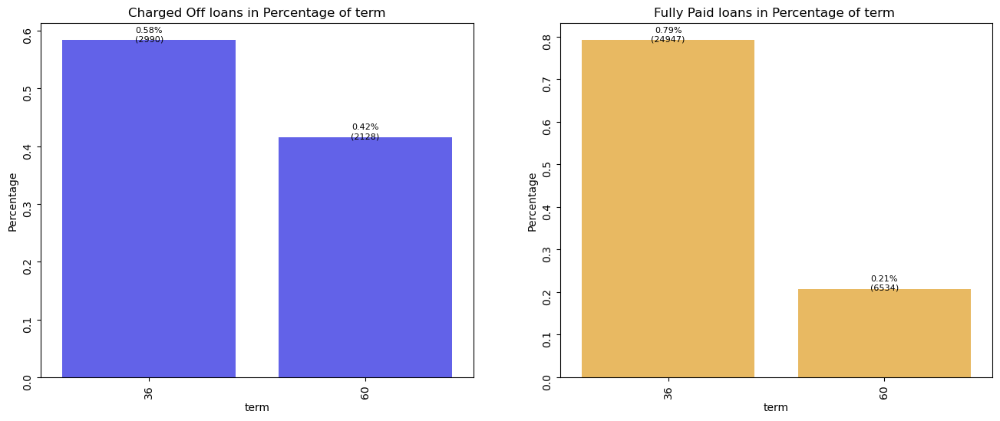

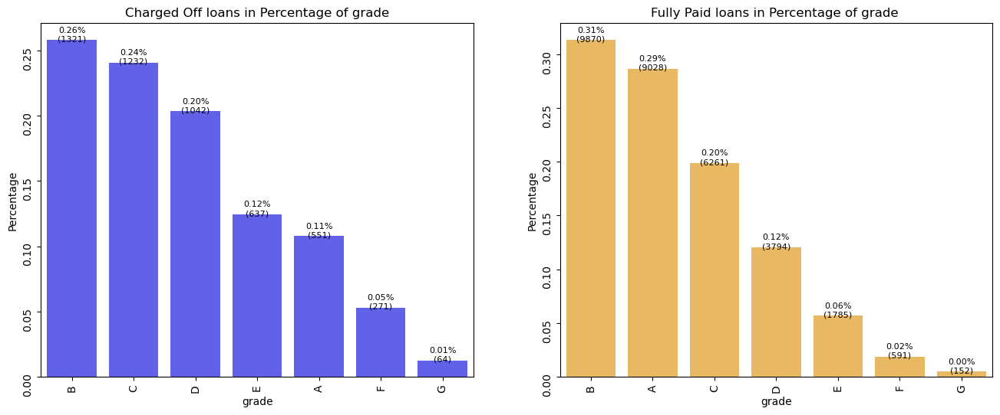

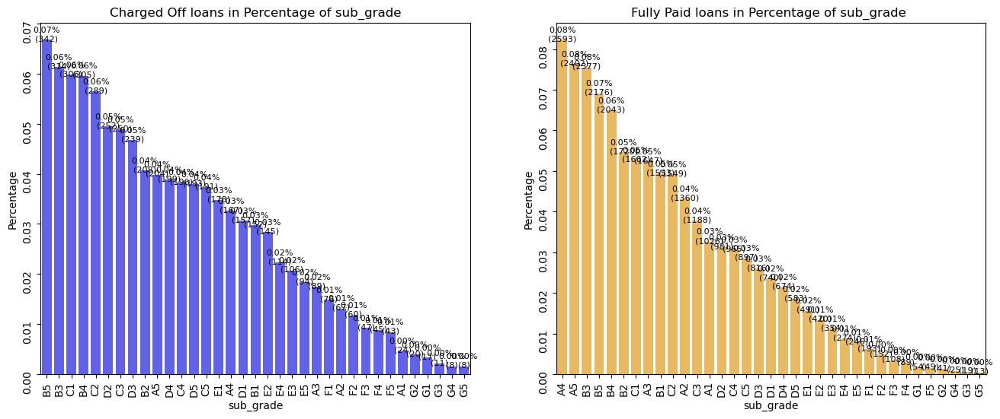

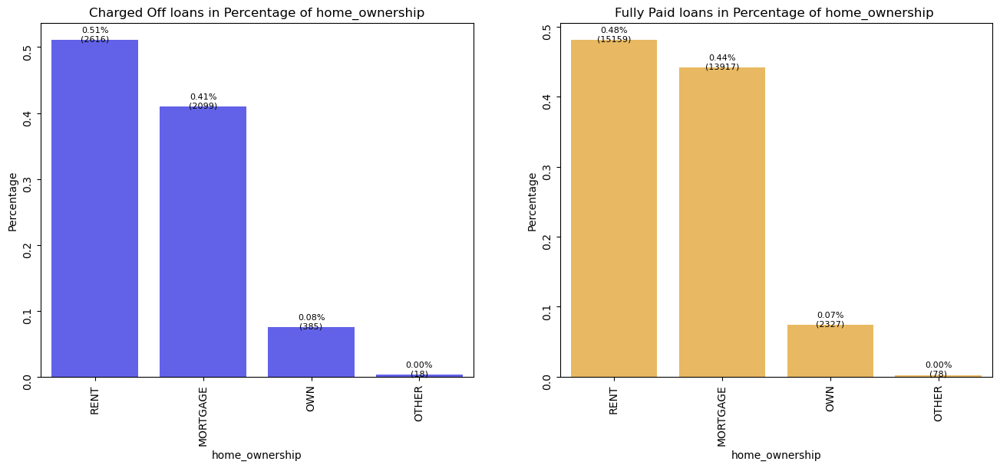

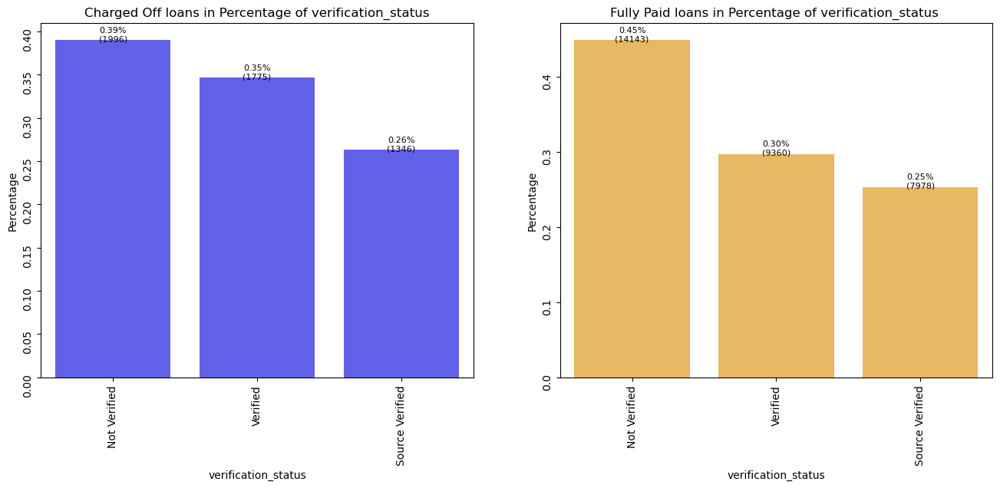

...

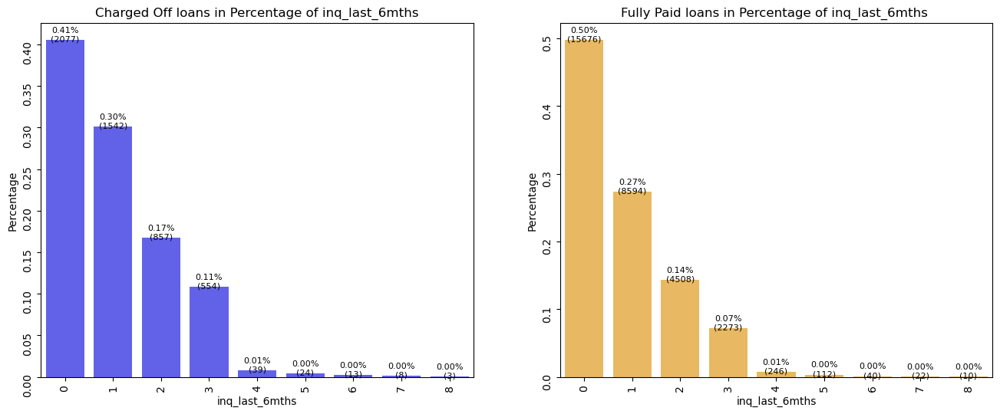

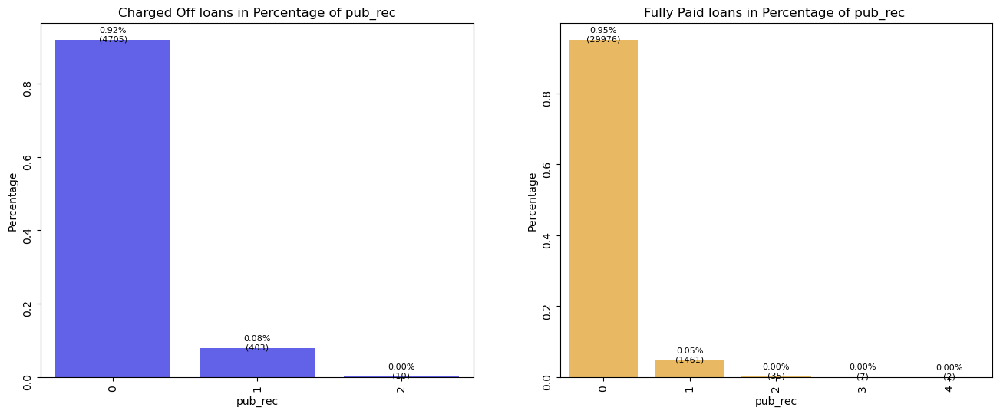

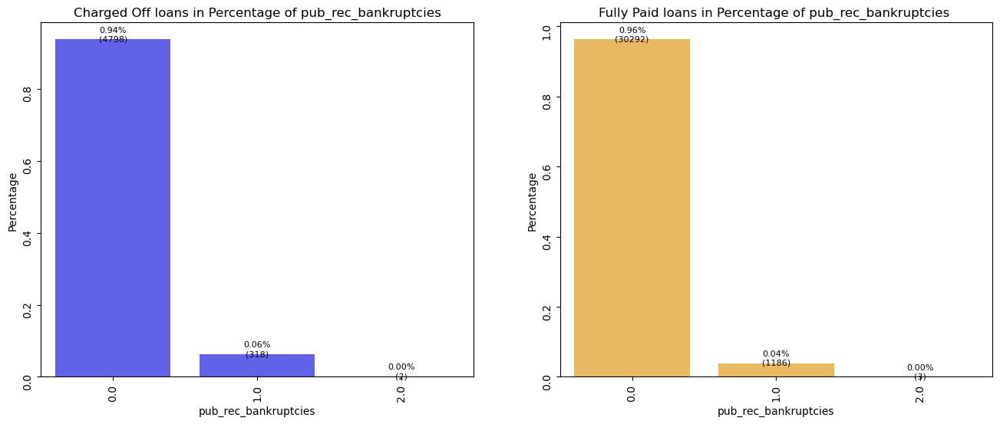

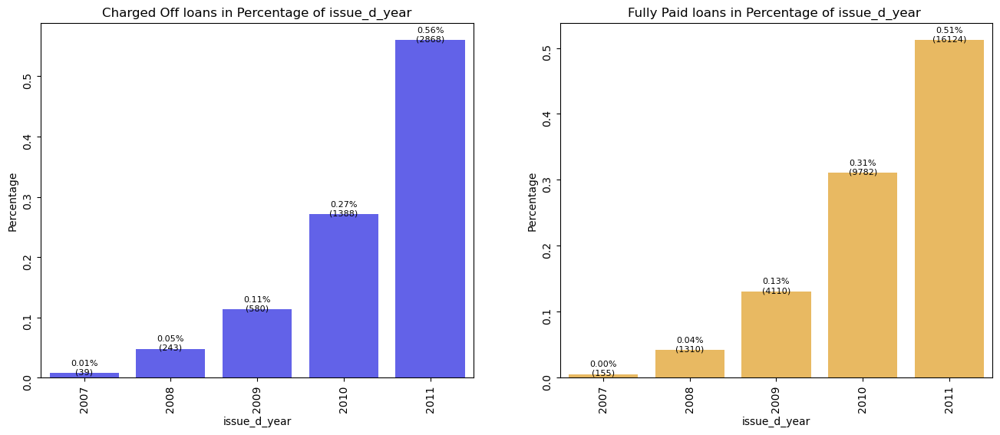

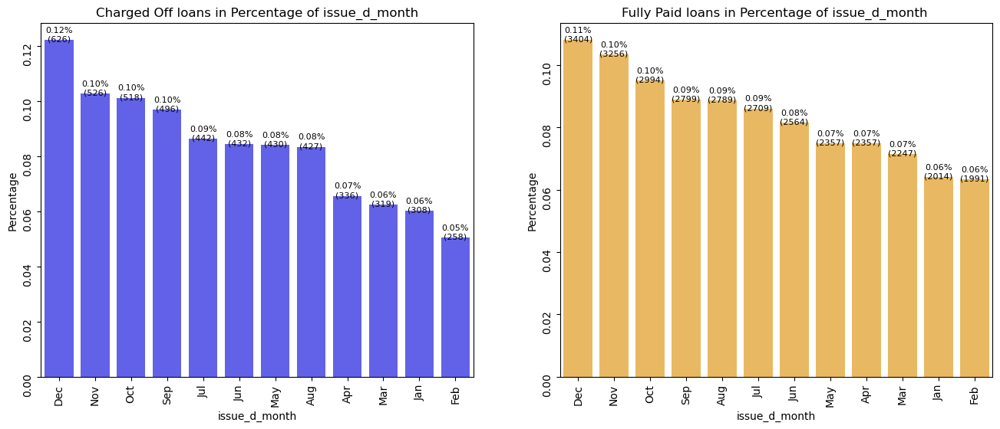

In [87]:
# Plot Barplot for all the categorical columns
for col in cat_cols:
    # Create a figure with two subplots for each loan status
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

    # Plot for Charged Off
    sns.barplot(x=col, y='percentage', data=df_defaulted[col].value_counts(normalize=True).reset_index(name='percentage'),
                color='blue', label='Charged Off', alpha=0.7, ax=axes[0])
    axes[0].set_title(f"Charged Off loans in Percentage of {col}")
    axes[0].set_xlabel(col)
    axes[0].set_ylabel("Percentage")    
    axes[0].tick_params(rotation=90)

    # Add count labels in each bar for Charged Off
    for p in axes[0].patches:
        axes[0].annotate(f'{p.get_height():.2f}%\n({int(p.get_height() * len(df_defaulted))})',
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', fontsize=8, color='black', xytext=(0, 5),
                         textcoords='offset points')

    
    # Plot for Fully Paid
    sns.barplot(x=col, y='percentage', data=df_fullypaid[col].value_counts(normalize=True).reset_index(name='percentage'),
                color='orange', label='Fully Paid', alpha=0.7, ax=axes[1])
    axes[1].set_title(f"Fully Paid loans in Percentage of {col} ")
    axes[1].set_xlabel(col)
    axes[1].set_ylabel("Percentage")    
    axes[1].tick_params(rotation=90)

    # Add count labels in each bar for Fully Paid
    for p in axes[1].patches:
        axes[1].annotate(f'{p.get_height():.2f}%\n({int(p.get_height() * len(df_fullypaid))})',
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', fontsize=8, color='black', xytext=(0, 5),
                         textcoords='offset points')

    plt.show()


#### Observations
- Loans with 36 months of term has higher probably of defaulting compared to 60 months.
- B grade loans have higher probability of defaulting followed by grades C and D. When comparing fully paid and charged off, we can observe that A grade loans have highest probably of being paid off.
- B5 subgrade loans have highest probably of default followed by B3 and C1. A4, A5 and B3 sub grade loans have highest probably of being fully paid off.
- People living in rented house have highest probability of defaulting compared to mortgage and own.
- Surprisingly the loans with income source not verified are the ones that is getting mostly fully paid
- Out of all the defaulted loans, around 50% were taken for the purpose of debt consolidation followed by other and credit card.
- Out of all the defaulted loans, most of the customers were staying in state CA followed by FL and NY.
- Year on year from 2007 until 2011 there has been significant increase in the number of loans indicating growing business.
- As the year progresses, month on month the issue of loans also increases across all the years.

## Bivariate Analysis

### Numerical vs Numerical

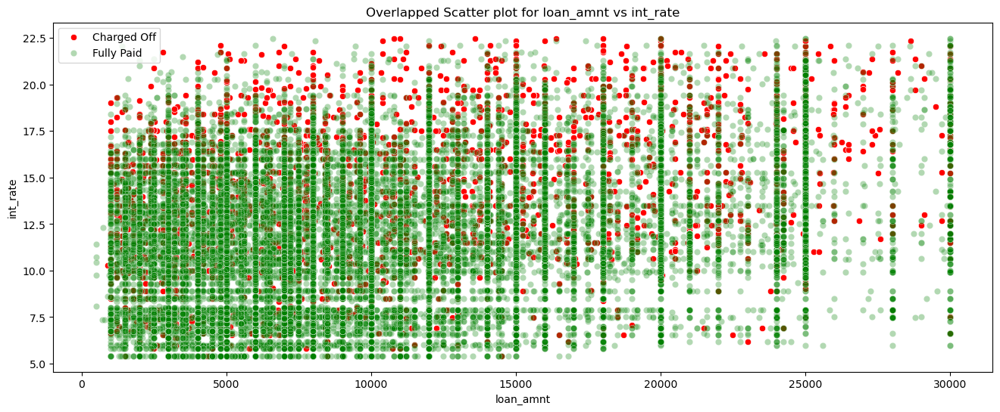

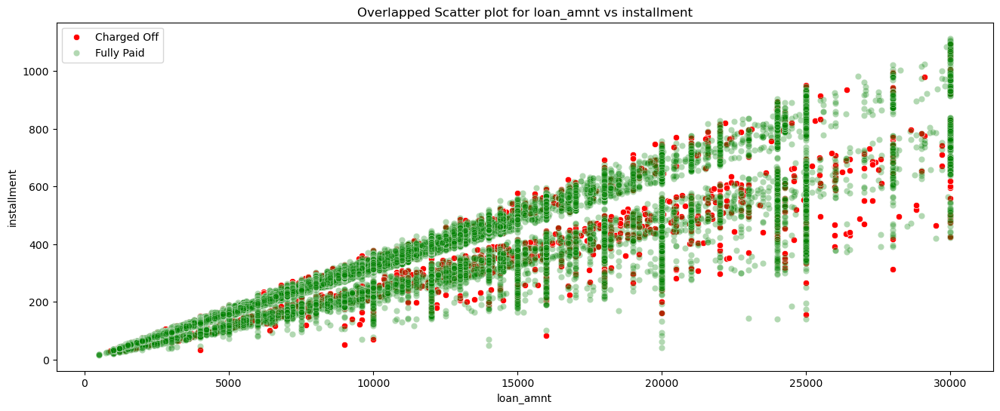

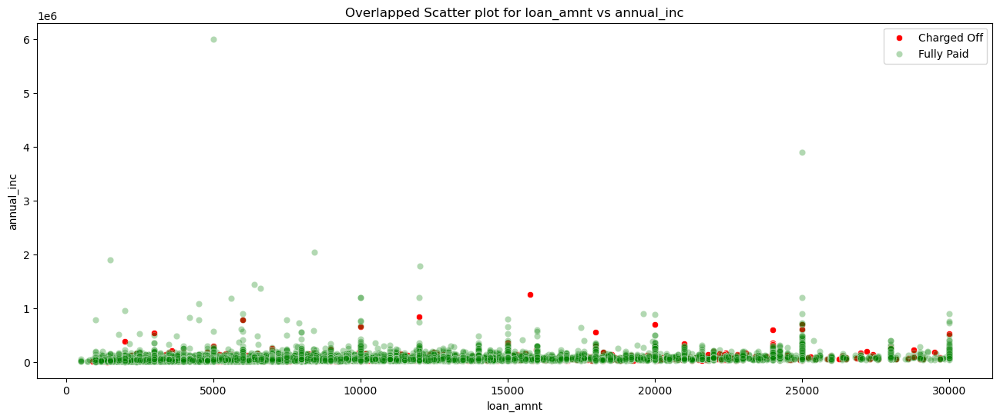

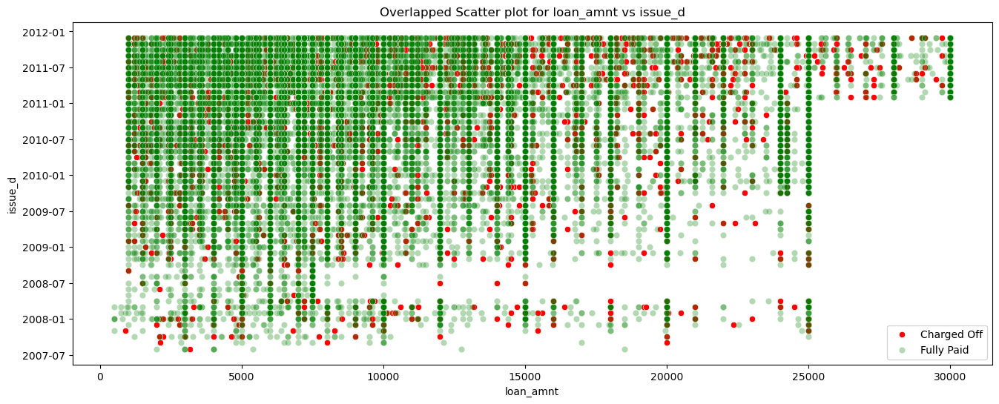

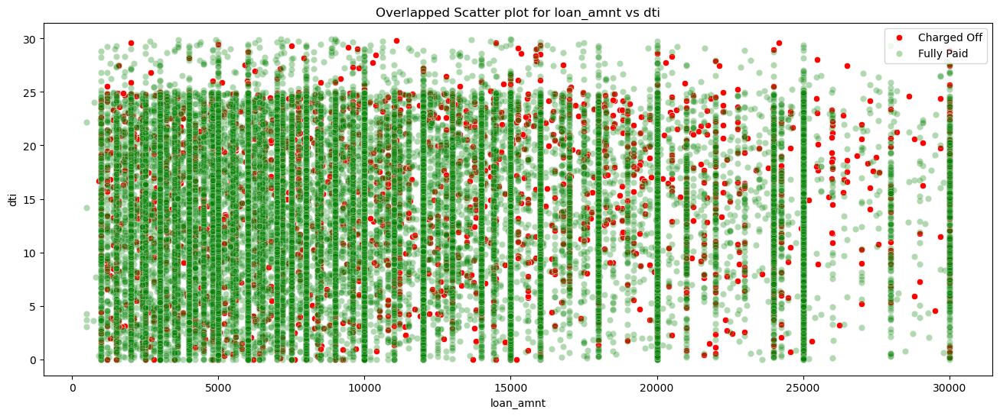

...

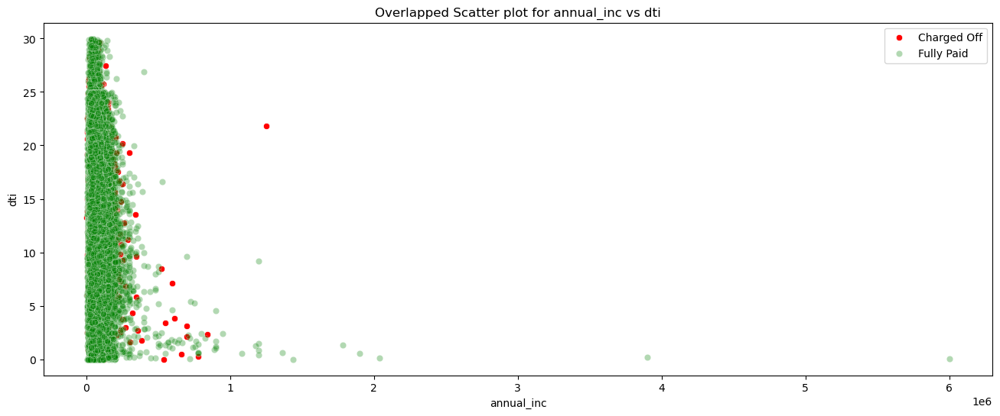

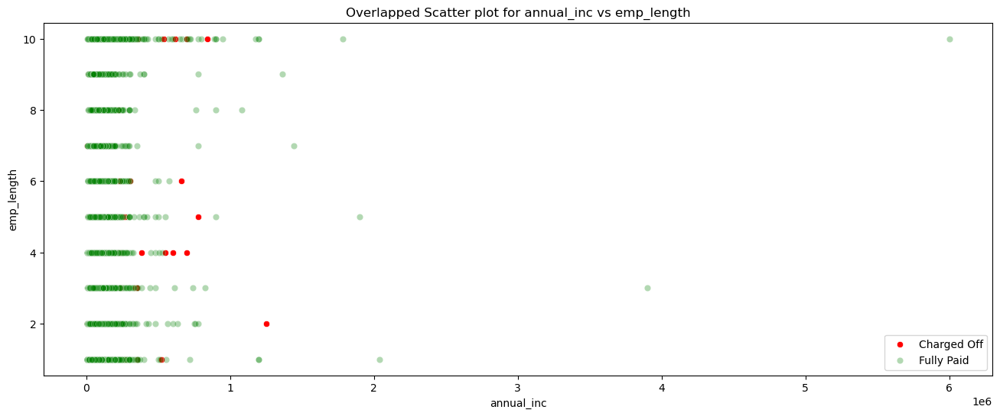

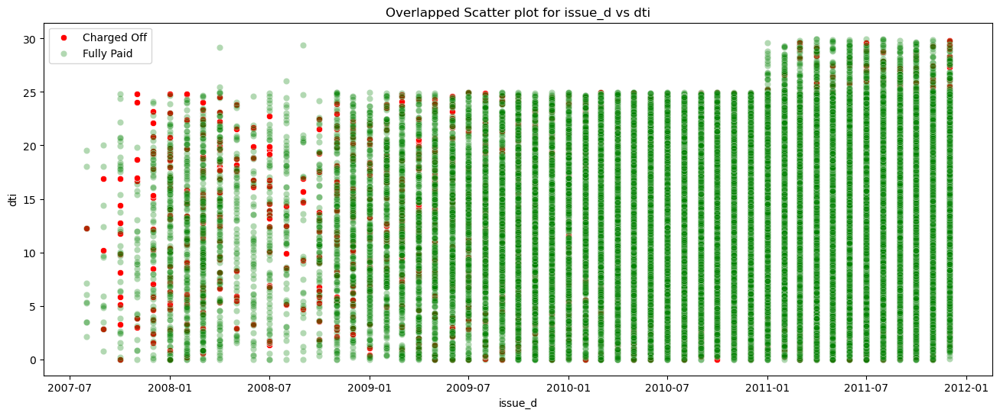

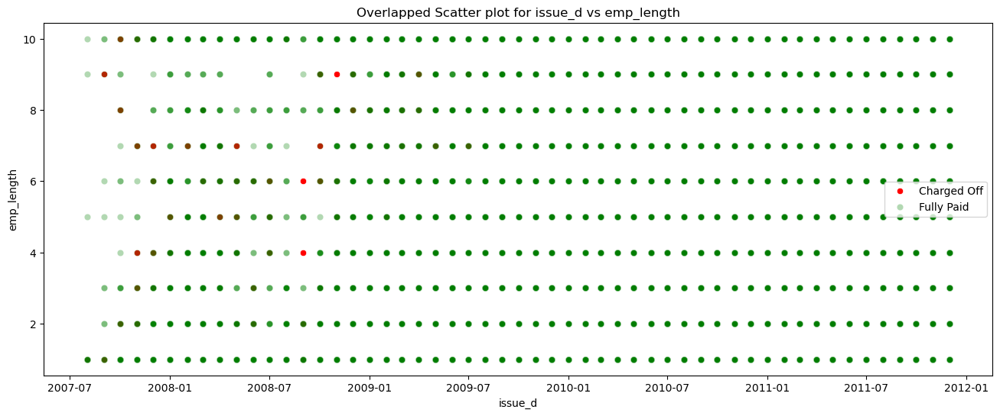

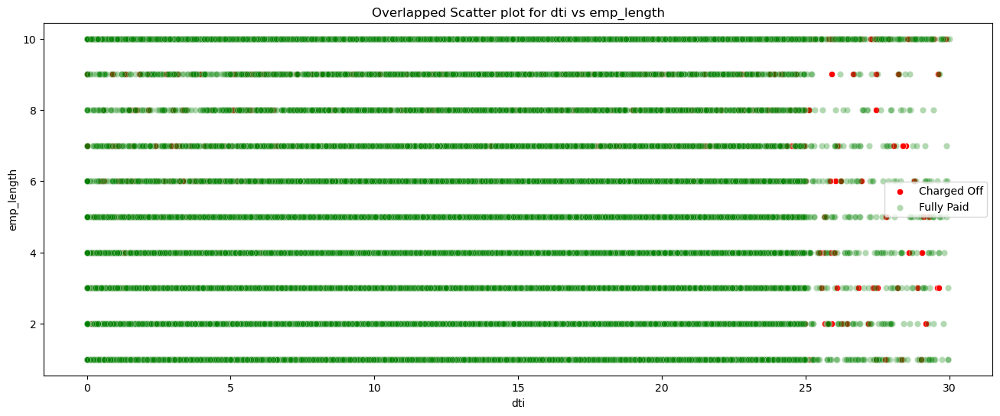

In [88]:
# Iterate through only unique pairs of numerical columns and plot overlapped scatter plot
for i, col1 in enumerate(num_cols[:-1]):
    for col2 in num_cols[i + 1:]:
        plt.figure(figsize=(16, 6))
        plt.title(f"Overlapped Scatter plot for {col1} vs {col2}", fontsize=12)
        sns.scatterplot(x=df_defaulted[col1], y=df_defaulted[col2], label='Charged Off', alpha=1.0, color='red') #highlight the defualted loans in solid red dot
        sns.scatterplot(x=df_fullypaid[col1], y=df_fullypaid[col2], label='Fully Paid', alpha=0.3, color='green') #highlight the fully paid loans in green dot with 70% transparency
        plt.legend()
        plt.show()

#### Observations
- Looking at the distribution of the interest rate and loan amount, it is evident that irrespective of loan amount, the customer is likely to default more if the interest rate is higher.
- Looking at the distribution of the DTI and loan amount, it is evident that those customers are more likely to default whose debt to income ratio is more than 25 or the loan amount is more than 25000 irrespective of DTI value.


### Numerical Vs Categorical

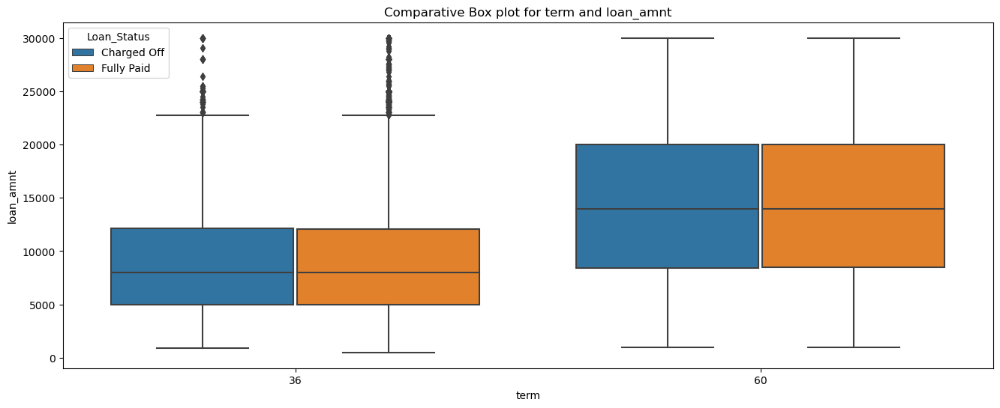

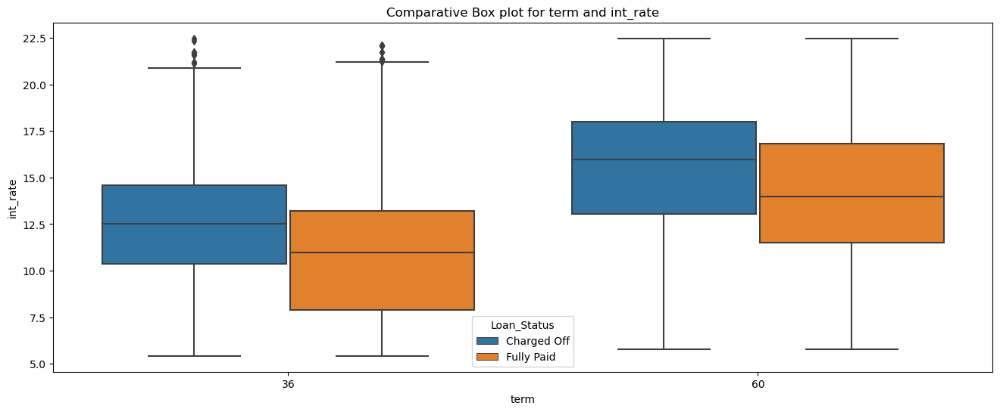

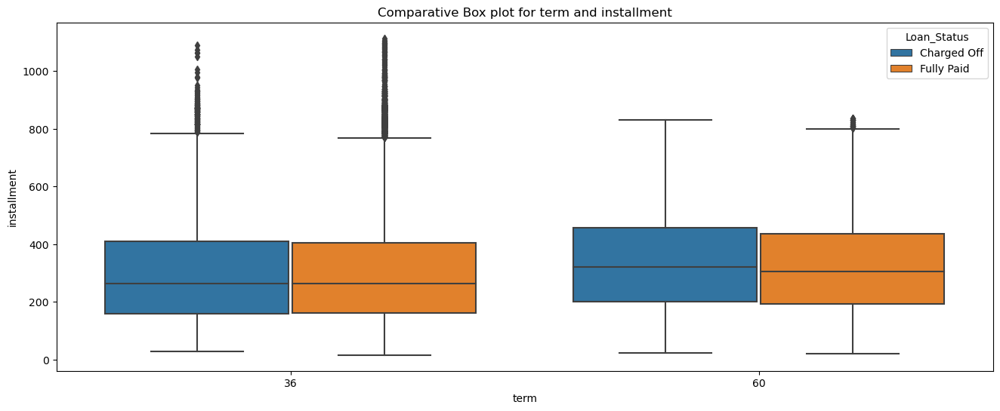

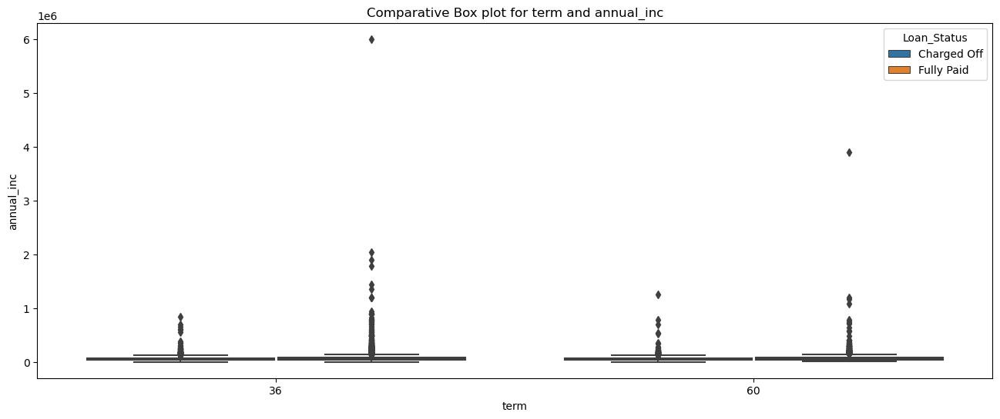

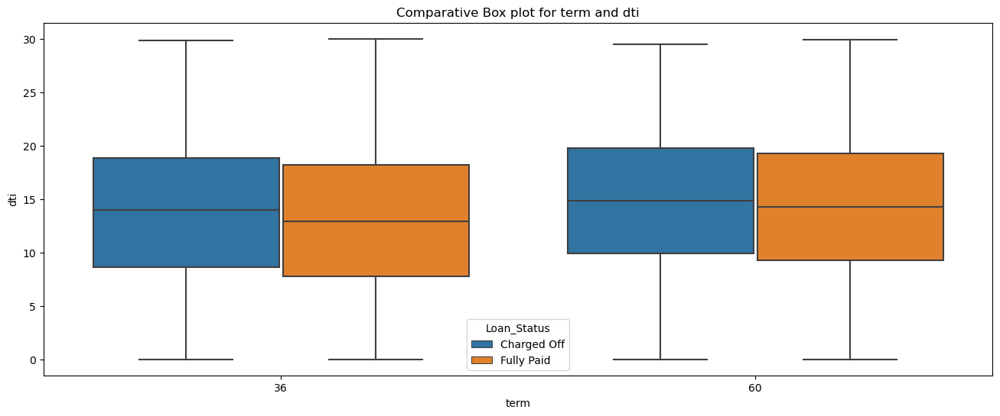

...

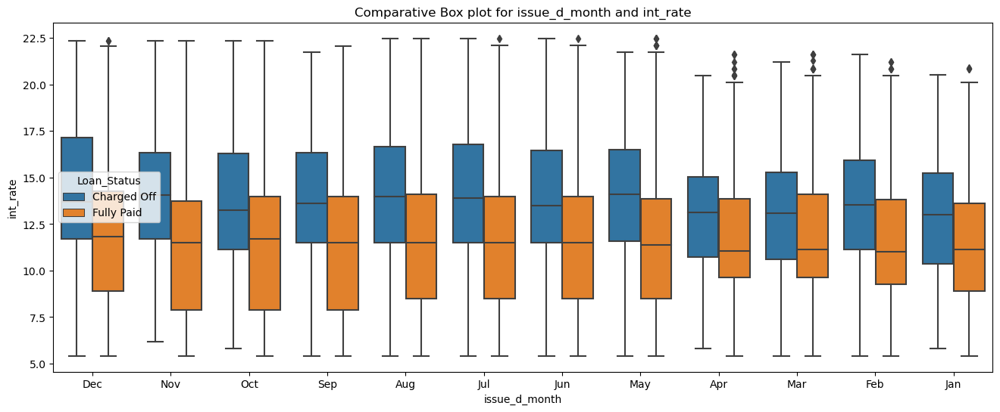

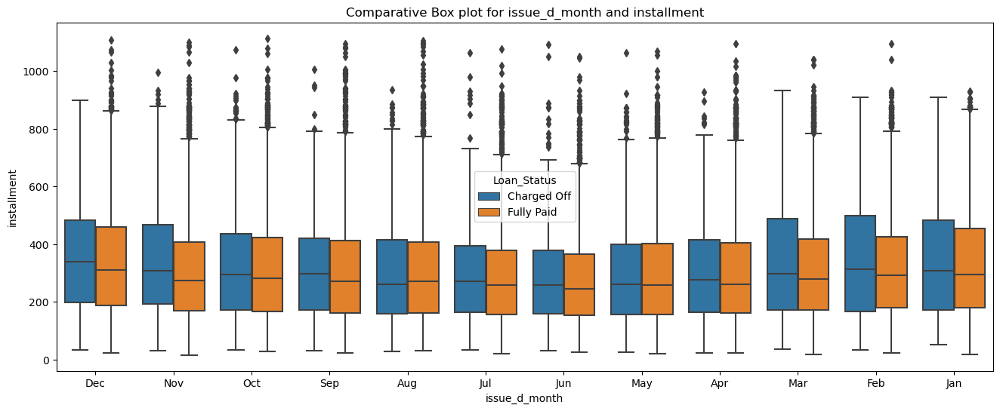

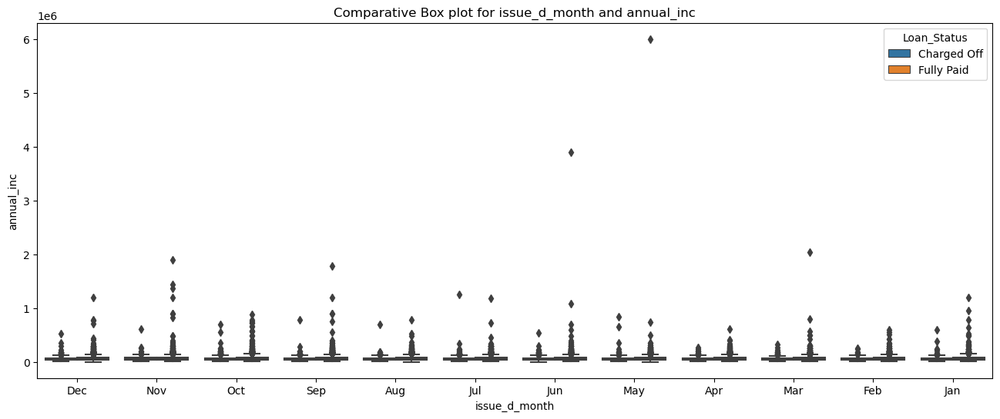

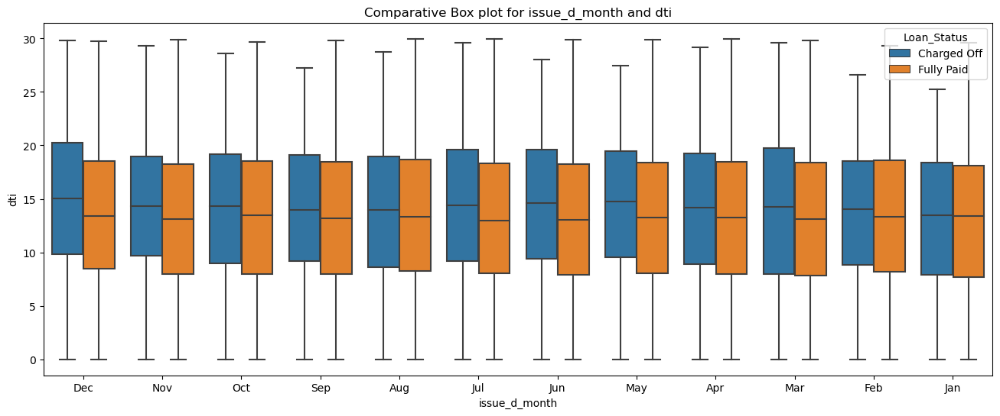

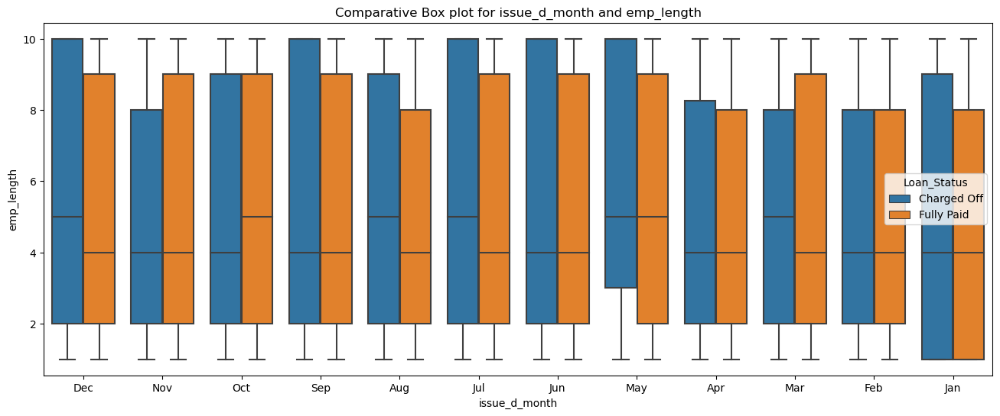

In [89]:
# Iterate through all combinations of a categorical and a numerical column to plot box plots
for col1 in cat_cols:
    for col2 in num_cols:
        if not pd.api.types.is_datetime64_any_dtype(df_defaulted[col2]): # Skip datetime columns
            plt.figure(figsize=(16, 6))

            # Combine data from both defaulted and fully paid loans for the same boxplot
            combined_data = pd.concat([df_defaulted[[col1, col2]].assign(Loan_Status='Charged Off'),
                                       df_fullypaid[[col1, col2]].assign(Loan_Status='Fully Paid')])

            # Create overlapped boxplot
            plt.title(f"Comparative Box plot for {col1} and {col2}", fontsize=12)
            sns.boxplot(x=col1, y=col2, hue='Loan_Status', data=combined_data)
            plt.show()


#### Observations
- Looking at the comparative box plots of loan term and interest rate, it is evident that for both 36 month and 60 months loan term, the median of interest rate has been higher for defaulted loans vs fully paid loans. 
- Looking at the comparative box plots of employment length and grade, it is evident that defaulting customers have either same or more employment number of years irrespective of grade of loan.
- Looking at the comparative box plots of home ownership vs loan_amount and interest rate, it is evident that irrespective of home ownership value, the median of defaulted loan is higher than fully paid loan. Surprisingly the median of homeloan amount for other is very much higher for defaulted loans.
- Looking at the comparative box plots of inquiry last made in last 6 months vs loan_amount, it is strongly evident that any customer who has made 8 inquiries and had loan amount greater than 15000 is almost likely to default. This can be a good indicator.
- Looking at the comparative box plots of public record bankrupcies vs loan_amount, it is strongly evident that any customer with 2 bankrupcy records with a loan amount greater than 10000 is almost likely to default. This can be a good indicator.
- Looking at the comparative box plots of public record vs loan_amount, it is strongly evident that any customer with more than 2 bankrupcy records will not default irrespective of the loan amount. This can be a good indicator to grant loan.


### Categorical Vs Categorical

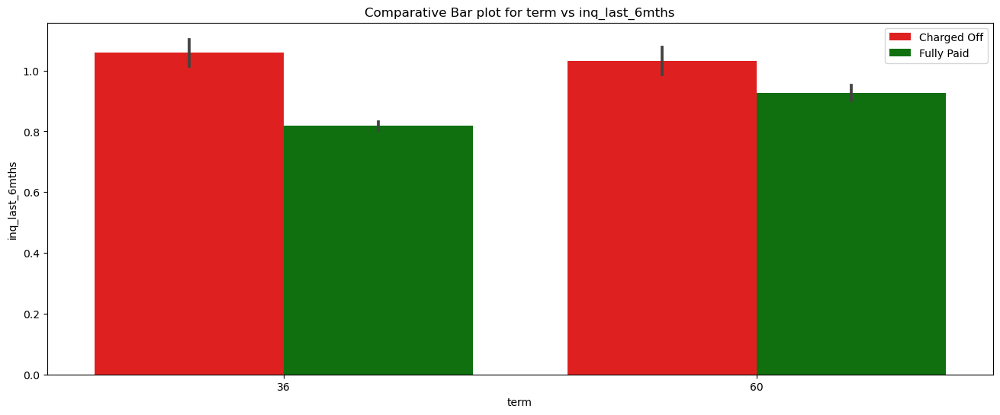

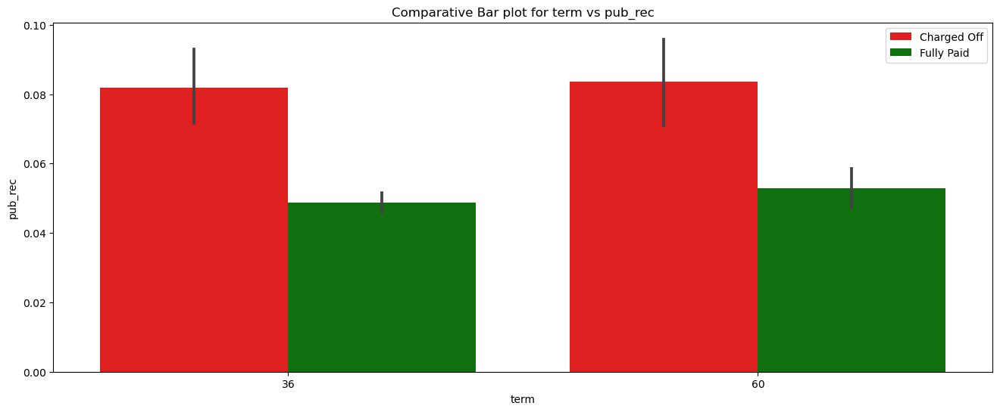

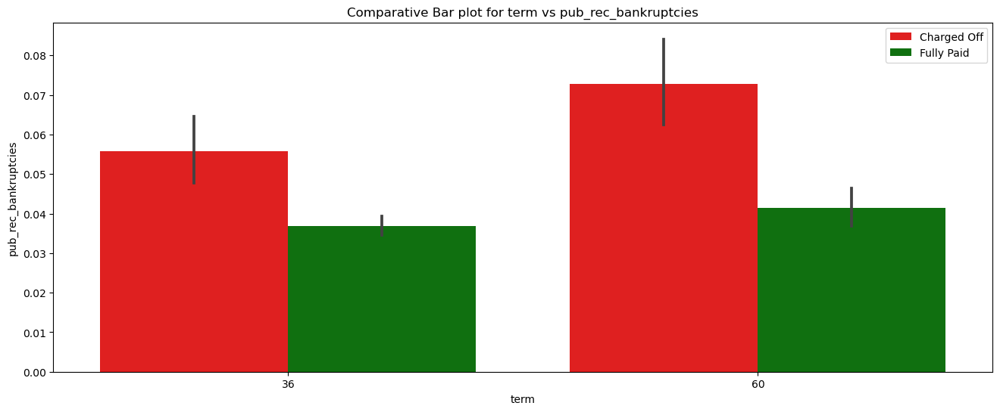

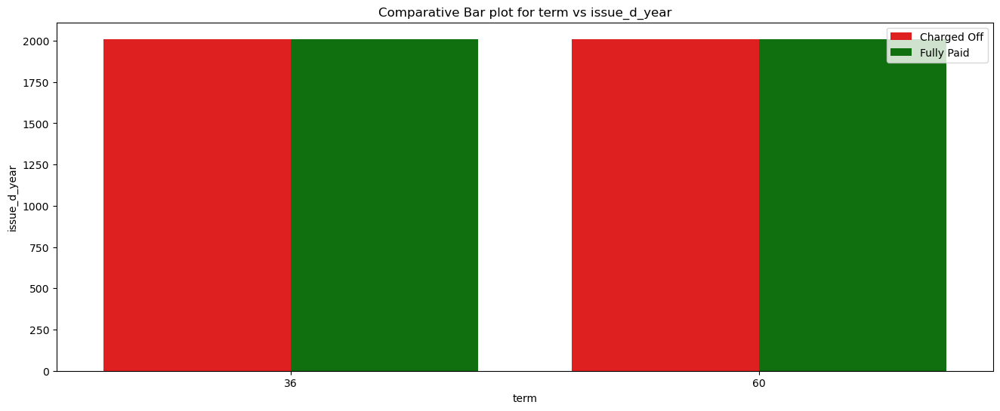

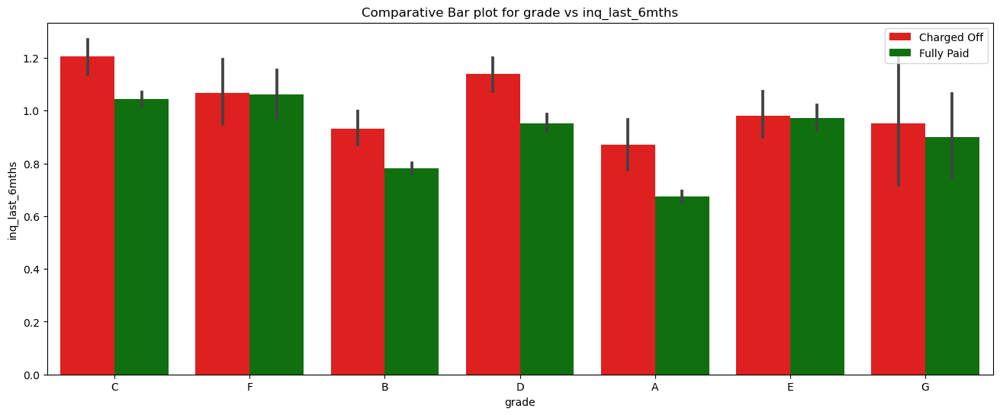

...

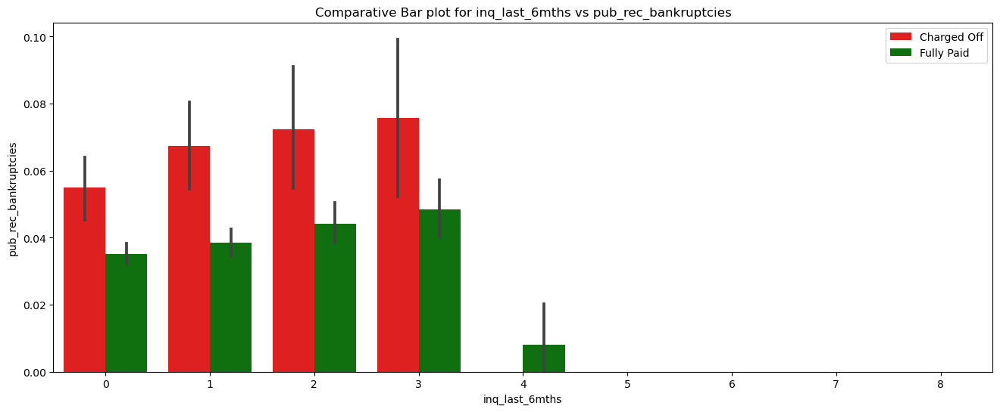

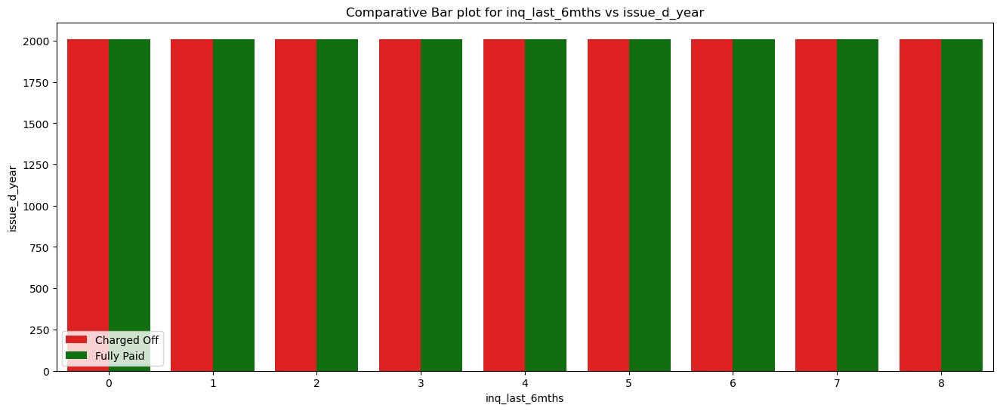

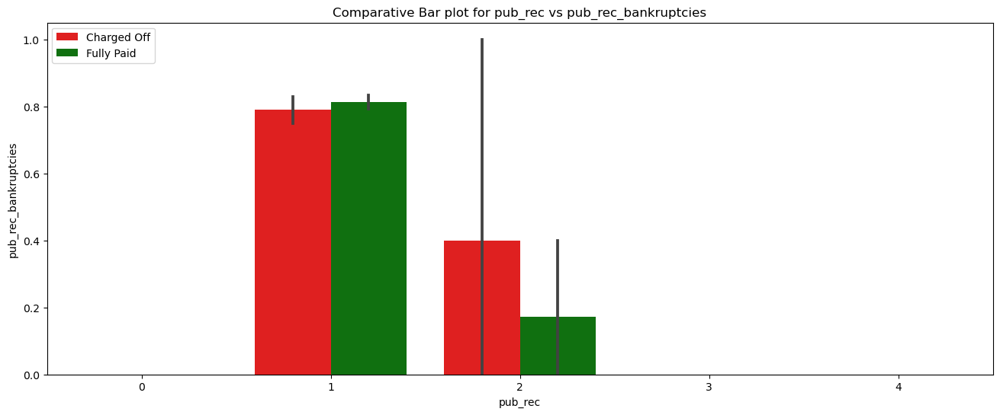

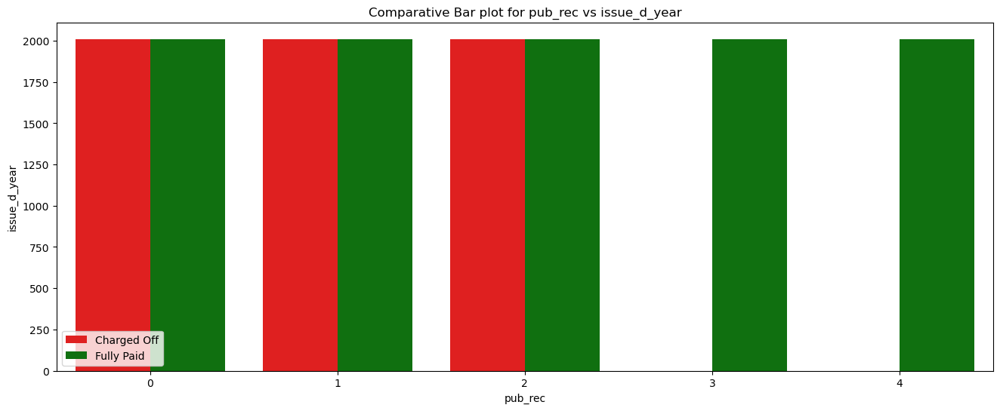

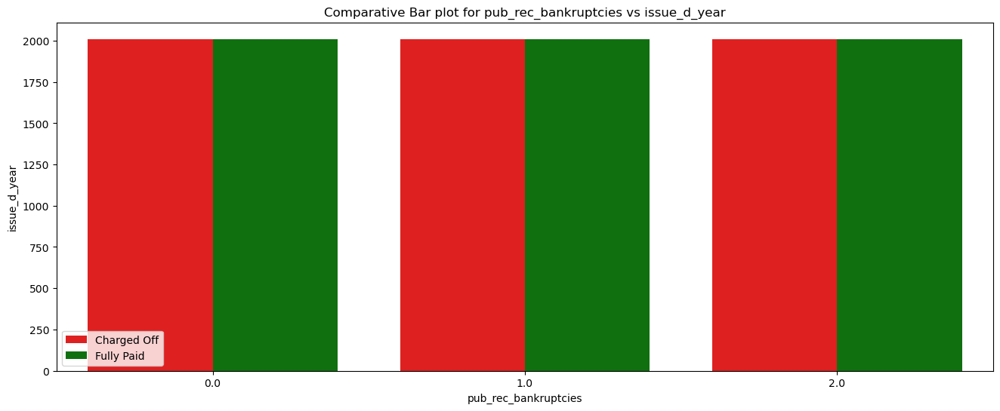

In [91]:
# Iterate through only unique pairs of categorical columns to plot a comparative bar plot
for i, col1 in enumerate(cat_cols[:-1]):
    for col2 in cat_cols[i + 1:]:
        if (pd.api.types.is_any_real_numeric_dtype(df_defaulted[col2])): #On the Y axis include only the columns hvaing numeric values
            plt.figure(figsize=(16, 6))
            # Combine data from both defaulted and fully paid loans for the same bar plot
            combined_data = pd.concat([df_defaulted[[col1, col2]].assign(Loan_Status='Charged Off'),
                                       df_fullypaid[[col1, col2]].assign(Loan_Status='Fully Paid')])
            plt.title(f"Comparative Bar plot for {col1} vs {col2}", fontsize=12)
            sns.barplot(x=col1, y=col2, hue='Loan_Status', data=combined_data, palette={'Charged Off': 'red', 'Fully Paid': 'green'})
            plt.legend()
            plt.show()


#### Observations
- Looking at the comparative box plots of loan term and grade, it is evident that for F grade, the median loan amount of defaulted loan is much higher than fully paid loans. Whereas for G grade, the median loan amount of fully paid loans is much higher than defaulted loans. And surprisingly the median interest rate is same for G grade loans for both fully paid and defaulted loans.
- Looking at the barplot graphs of purpose and inquired in last 6 month, customers who inquired in last 6 months for the purpose of home, home improvement or education purposes have more defaulters when compared to other purposes.
- Looking at the barplot graphs of Home ownership and public records bankruptcies, customers with home ownership of OTHER followed by MORTGAGE have higher public record bankruptcies.

## Multivariate Analysis

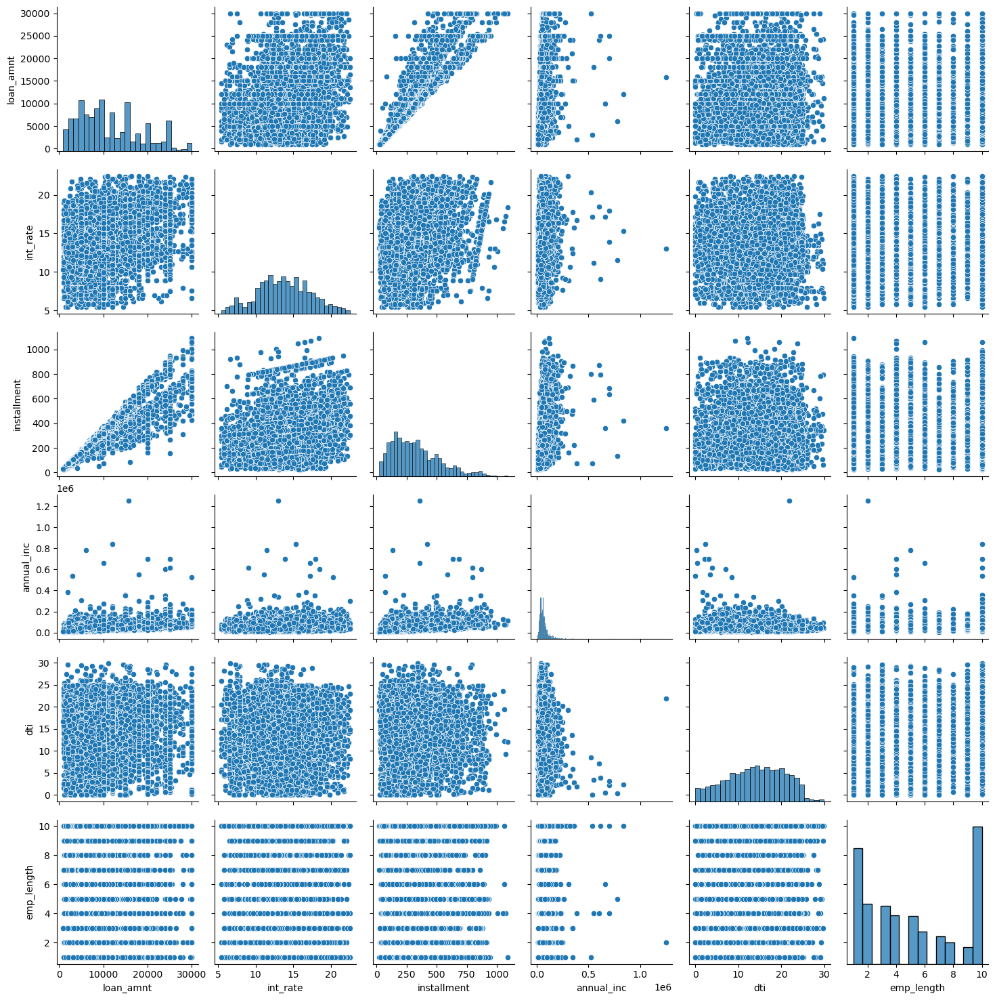

In [92]:
sns.pairplot(df_defaulted[num_cols]) #pairplot only for numerical columns of defaulted loans
plt.show()

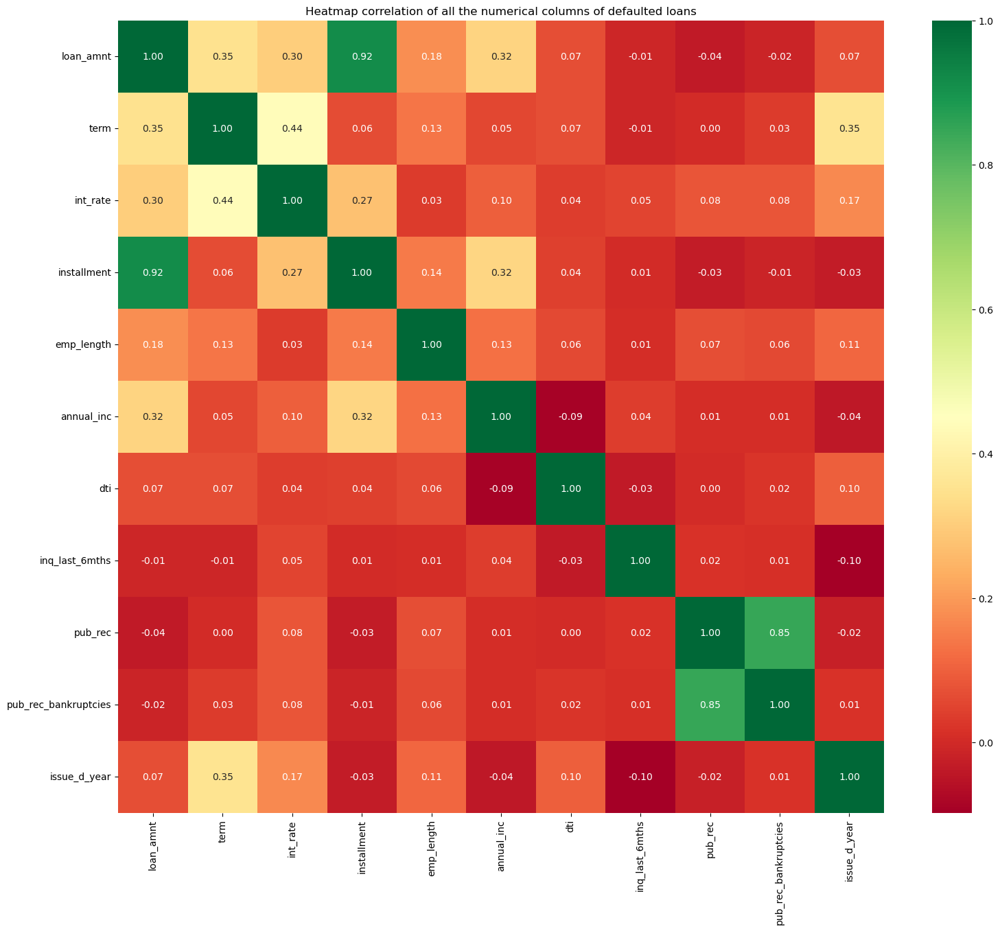

In [93]:
plt.figure(figsize=(18,15)) 
plt.title("Heatmap correlation of all the numerical columns of defaulted loans", fontsize=12)
sns.heatmap(df_defaulted.select_dtypes(include='number').corr(),annot=True,fmt='.2f',cmap="RdYlGn") #include only columns having numeric values of defualted loans
plt.show()


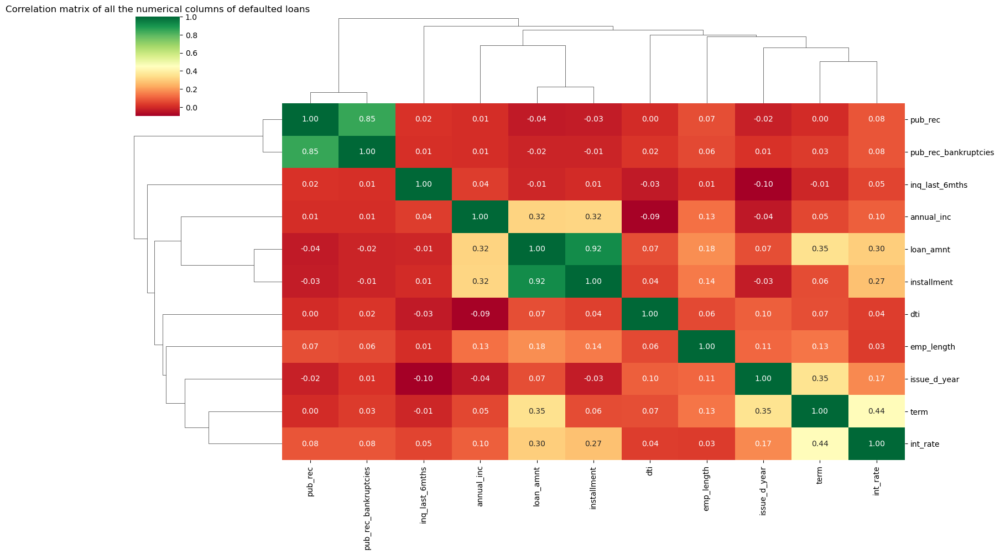

In [94]:
#plotting correaltion matrix on clustermap
sns.clustermap(df_defaulted.select_dtypes(include='number').corr(),annot=True,figsize=(16, 10), fmt='.2f', cmap="RdYlGn")
plt.title("Correlation matrix of all the numerical columns of defaulted loans", fontsize=12)
plt.show()

#### Observations
- Public record and public record bankrupcies are highly correlated
- Annual income and debt to income ratio is least correlated
- Annual income have low correlation to the customers public record bankruptcies.
- Loan amount and installment have high correlation.  
- Employment length and inquiry in the last 6 months have low correlation.
- Based on the employment length, interest rates are not offered to the employees.
- Customers with high interest rate have strong correlation with the loan term.